In [1]:
import numpy as np
import pandas as pd
import unicodedata
import re
import uuid

In [2]:
import sys
sys.path.append('/Users/elsa.luneville/anaconda3/lib/python3.6/site-packages/LatLon')

In [3]:
import converters_copie

In [4]:
from pyexcel_ods import get_data

In [5]:
#sauvamertest = pd.read_excel("../data/export_snosan.xlsx", 
 #                            converters= {"Position latitude": converters_copie.CoordinatesConverter.latitude_dms_to_dd,
  #                                        "Position longitude": converters_copie.CoordinatesConverter.longitude_dms_to_dd
   #                                       
    #})


In [6]:
sauvamer = pd.read_excel("../data/export_snosan.xlsx")

In [7]:

def colname_cleaning(df):
	return df.rename(columns=lambda x: x.replace(' ', '_').\
                     lower().replace("é","e").\
                     replace("ê","e").\
                     replace("(","").\
                     replace(")","").\
                     replace("'","").\
                     replace("?", "").\
                     encode('utf-8').decode('ascii', 'ignore'))

In [8]:
sauvamer['state_mer'] = sauvamer['Mer (Douglas)'].str.split('(').str[0]

In [9]:
di_mer = {'Plate ': 0,
          'Ridée ': 1,
          'Belle ': 2,
          'Peu agitée ': 3 ,
          'Agitée ': 4, 
          'Forte ' : 5,
          'Très forte ' : 6,
          'Grosse ' : 7,
          'Très grosse ' : 8 ,
          'Enorme ': 9}

In [10]:
sauvamer['etat_mer'] = sauvamer['state_mer'].map(di_mer)

In [11]:
sauvamer = sauvamer.rename(columns=lambda x : x.replace(' ', '_'))
sauvamer = sauvamer.rename(columns=lambda x : x.lower())
sauvamer = sauvamer.rename(columns=lambda x: x.replace("é","e"))
sauvamer = sauvamer.rename(columns=lambda x: x.replace("ê","e"))
sauvamer = sauvamer.rename(columns=lambda x: x.replace("(",""))
sauvamer = sauvamer.rename(columns=lambda x: x.replace(")",""))
sauvamer = sauvamer.rename(columns=lambda x: x.replace("'",""))
sauvamer = sauvamer.rename(columns=lambda x: x.encode('utf-8').decode('ascii', 'ignore'))

In [12]:
sauvamer['nom_etablissement'] = sauvamer.nom_etablissement.str.replace("STATION", "")

In [13]:
sauvamer.etat_mer = sauvamer.etat_mer.astype('category')

In [14]:
#sauvamer.apply(lambda x: x.nunique()/len(sauvamer)*100).round(2).sort_values()

In [15]:
sauvamer['sitrep_cross'] = sauvamer.n_sitrep.str.extract("CROSS (.*\/\d+/\d+)")

/Users/elsa.luneville/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: currently extract(expand=None) means expand=False (return Index/Series/DataFrame) but in a future version of pandas this will be changed to expand=True (return DataFrame)
  """Entry point for launching an IPython kernel.


In [16]:
sauvamer['sitrep'] = sauvamer.sitrep_cross.str.split("/").str[2]
sauvamer['sitrep']= sauvamer.sitrep.str.replace(r'(^0)', "")
sauvamer['sitrep']= sauvamer.sitrep.str.replace(r'(^0)', "")
sauvamer['sitrep']= sauvamer.sitrep.str.replace(r'(^0)', "")

In [17]:
sauvamer['cross'] = sauvamer.sitrep_cross.str.split("/").str[0]

In [18]:
sauvamer['cross'] = sauvamer['cross'].str.strip()

In [19]:
sauvamer['cross'] = sauvamer['cross'].str.replace(" ", "-")
sauvamer['cross'] = sauvamer['cross'].str.replace("É", "E")

In [20]:
sauvamer['cross_sitrep'] = sauvamer['cross'].str.lower() + '_' + sauvamer['sitrep']

In [21]:
sauvamer['cross'].value_counts()

LA-GARDE    1102
ETEL         998
CORSEN       498
JOBOURG      309
CORSE        192
GRIS-NEZ     138
REUNION       43
Name: cross, dtype: int64

In [22]:
sauvamer['type_inter'] = sauvamer.n_sitrep.str.extract(r"(MAS|SAR|DIV)")

/Users/elsa.luneville/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: currently extract(expand=None) means expand=False (return Index/Series/DataFrame) but in a future version of pandas this will be changed to expand=True (return DataFrame)
  """Entry point for launching an IPython kernel.


In [23]:
sauvamer.zone_littorale.value_counts()

ATLANTIQUE           1585
MEDITERRANEE         1357
MANCHE ET DOM-TOM     657
TERRITOIRE              2
Name: zone_littorale, dtype: int64

In [24]:
sauvamer.cp = sauvamer.cp.astype('object')

In [25]:
code_poste = pd.read_csv("../data/laposte_hexasmal.csv", sep=";")

In [26]:
code_poste = code_poste[['Nom_commune', 'Code_postal']]

In [27]:
code_poste = code_poste.drop_duplicates()

In [28]:
#sauvamer = pd.merge(sauvamer, code_poste, how='left', left_on=['cp'], right_on=['Code_postal'], validate="one_to_one").drop('Code_postal', 1)

In [29]:
sauvamer[sauvamer.nb_personnes_secourues > 20]['compte_rendu_patron']

1403    Evacuation de 27 personnes du port du Pradet b...
1404    Récupération de 23 personnes réfugiées sur les...
1961    1400 départ en patrouille de la SN 710 pour co...
1962    0705 Mise en alerte par le Cross Med pour situ...
2895    A - IDENTITÉ VÉHICULE(S) IMPLIQUÉ(S)\nINCONNU\...
2972    A - IDENTITÉ VÉHICULE(S) IMPLIQUÉ(S)\nINCONNU\...
Name: compte_rendu_patron, dtype: object

In [30]:
sauvamer = sauvamer.applymap(lambda x: x.upper() if isinstance(x, str) else x)

In [31]:
pd.set_option('display.height',1000)
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',500)
pd.set_option('display.width',2000)
pd.options.display.max_colwidth = 100

height has been deprecated.



In [32]:
# Convert fausses alertes into Boolean
sauvamer.fausse_alerte = sauvamer.fausse_alerte.replace({'OUI': True, 'NON': False})*1

In [33]:
di_zone_inter = {'EAUX TERRITORIALES (300 M À 12 NQ)': 'EAUX TERRITORIALES',
                 'PLAGE ET 300M': 'PLAGE ET 300 MÈTRES',
                 'EAUX FRANÇAISES (SUP. À 12 NQ)': 'RESPONSABILITÉ FRANÇAISE',
                 'EAUX ETRANGÈRES': 'RESPONSABILITÉ ÉTRANGÈRE'
                 }

In [34]:
sauvamer.zone_dintervention.replace(di_zone_inter, inplace=True)

In [35]:
# Drop some useless columns
sauvamer = sauvamer.drop(['mer_douglas', 'type_de_rapport', 'n_sitrep', 'state_mer', 'sitrep_cross'], axis=1)

In [36]:
# Rename some columns 
sauvamer = sauvamer.rename(columns={'nets': 'etablissement_id', 'n_de_rapport': 'numero_de_rapport', 'cp': 'code_postal', 'nb_de_pers._tirees_daffaire_elles-memes':'nb_personnes_tirees_daffaire_elles-memes'})

In [37]:
sauvamer.columns

Index(['etablissement_id', 'numero_de_rapport', 'zone_dintervention', 'date_de_saisie', 'compte_rendu_patron', 'commentaires_patron', 'nom_etablissement', 'zone_littorale', 'code_postal', 'date_de_sortie', 'heure_de_lalerte', 'motif_de_lalerte', 'fausse_alerte', 'nb_personnes_tirees_daffaire_elles-memes', 'nb_personnes_secourues', 'nb_personnes_disparues', 'nb_personnes_decedees', 'nom_du_navire', 'type_embarcation', 'resultat_sur_lembarcation', 'moyen_principal', 'position_latitude', 'position_longitude', 'delai_appareillage_min', 'duree_reelle_min', 'etat_mer', 'sitrep', 'cross', 'cross_sitrep', 'type_inter'], dtype='object')

In [38]:
duplicates = (sauvamer.cross_sitrep.duplicated(keep=False)) & (sauvamer.cross_sitrep.notnull())

In [39]:
fusion_duplicate = sauvamer[duplicates].sort_values(['cross_sitrep','date_de_sortie']).groupby('cross_sitrep', as_index=False).agg(lambda x: x.tolist())

In [40]:
fusion_col = pd.DataFrame(index=fusion_duplicate.index)

for col in fusion_duplicate:
    fusion_col = fusion_col.merge(fusion_duplicate[col].apply(pd.Series).add_prefix(col), left_index=True, right_index=True)
    
 

In [41]:
# Change the name of cross_sitrep column
fusion_col.rename(columns={'cross_sitrep0': 'cross_sitrep'}, inplace=True)

In [42]:
# Replace nan if we want to keep only one columns and remove all other columns 

drop_list= []
flattened_list = []

for column in ('nom_du_navire', 'numero_de_rapport', 'zone_dintervention', 'date_de_saisie', 'zone_littorale', 'code_postal',\
               'heure_de_lalerte', 'fausse_alerte', 'type_embarcation', 'position_latitude','position_longitude', \
               'etat_mer', 'sitrep', 'cross'):
    fusion_col[column] = fusion_col[[col for col in fusion_col if col.startswith(column)]].\
    bfill(axis=1).iloc[:, 0]
    drop_list.append(([col for col in fusion_col if (col.startswith(column)) \
                        & ((col.endswith('0'))|(col.endswith('1')) | (col.endswith('2')) |(col.endswith('3')) \
                                    | (col.endswith('4')) | (col.endswith('5')) | (col.endswith('6')) \
                                   | (col.endswith('7'))|(col.endswith('8'))| (col.endswith('9')))]))
    for x in drop_list:
        for y in x:
            flattened_list.append(y)
fusion_col2 = fusion_col.drop(flattened_list, axis=1)


In [43]:
# Combine text report into one column

drop_list1= []
flattened_list1 = []

for column in ('compte_rendu_patron', 'commentaires_patron'):
    fusion_col2[column] = fusion_col2[[col for col in fusion_col2 if col.startswith(column)]].fillna("").apply(';'.join, axis=1)
    
    drop_list1.append(([col for col in fusion_col2 if (col.startswith(column)) \
                        & ((col.endswith('0'))|(col.endswith('1')) | (col.endswith('2')) |(col.endswith('3')) \
                                    | (col.endswith('4')) | (col.endswith('5')) | (col.endswith('6')) \
                                   | (col.endswith('7'))|(col.endswith('8'))| (col.endswith('9')))]))
    for x in drop_list1:
        for y in x:
            flattened_list1.append(y)
            
fusion_col_final = fusion_col2.drop(flattened_list1, axis=1)

In [44]:
fusion_col_final

,cross_sitrep,etablissement_id0,etablissement_id1,etablissement_id2,etablissement_id3,etablissement_id4,nom_etablissement0,nom_etablissement1,nom_etablissement2,nom_etablissement3,nom_etablissement4,date_de_sortie0,date_de_sortie1,date_de_sortie2,date_de_sortie3,date_de_sortie4,motif_de_lalerte0,motif_de_lalerte1,motif_de_lalerte2,motif_de_lalerte3,motif_de_lalerte4,nb_personnes_tirees_daffaire_elles-memes0,nb_personnes_tirees_daffaire_elles-memes1,nb_personnes_tirees_daffaire_elles-memes2,nb_personnes_tirees_daffaire_elles-memes3,nb_personnes_tirees_daffaire_elles-memes4,nb_personnes_secourues0,nb_personnes_secourues1,nb_personnes_secourues2,nb_personnes_secourues3,nb_personnes_secourues4,nb_personnes_disparues0,nb_personnes_disparues1,nb_personnes_disparues2,nb_personnes_disparues3,nb_personnes_disparues4,nb_personnes_decedees0,nb_personnes_decedees1,nb_personnes_decedees2,nb_personnes_decedees3,nb_personnes_decedees4,resultat_sur_lembarcation0,resultat_sur_lembarcation1,resultat_sur_lembarcation2,resultat_sur_lembarcation3,resultat_sur_lembarcation4,moyen_principal0,moyen_principal1,moyen_principal2,moyen_principal3,moyen_principal4,delai_appareillage_min0,delai_appareillage_min1,delai_appareillage_min2,delai_appareillage_min3,delai_appareillage_min4,duree_reelle_min0,duree_reelle_min1,duree_reelle_min2,duree_reelle_min3,duree_reelle_min4,type_inter0,type_inter1,type_inter2,type_inter3,type_inter4,nom_du_navire,numero_de_rapport,zone_dintervention,date_de_saisie,zone_littorale,code_postal,heure_de_lalerte,fausse_alerte,type_embarcation,position_latitude,position_longitude,etat_mer,sitrep,cross,compte_rendu_patron,commentaires_patron
0,CORSEN_1027,022PSCA,022PSCA,NaN,NaN,NaN,SNSM DE SAINT CAST LE GUILDO,SNSM DE SAINT CAST LE GUILDO,NaN,NaN,NaN,2017-09-10 13:20:00,2017-09-10 13:20:00,NaT,NaT,NaT,INQUIÉTUDE,INQUIÉTUDE,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,SANS INTERVENTION,ASSISTÉ,NaN,NaN,NaN,SNS602,SNS286,NaN,NaN,NaN,22.0,22.0,NaN,NaN,NaN,40.0,40.0,NaN,NaN,NaN,SAR,SAR,NaN,NaN,NaN,KAYAK,112550.0,EAUX TERRITORIALES,2017-09-11 11:32:12,ATLANTIQUE,22380.0,2017-09-10 12:58:00,0.0,ENGIN DE PLAGE,48°37'N,02°10' O,4.0,1027,CORSEN_1027,RECHERCHE EN BAIE DE LA FRESNAYE KAYAKISTE SUITE APPEL DU CROSS POUR INQUIÉTUDE;RECHERCHE D'UN K...,;;;;
1,CORSEN_1102,022PSQP,022PSQP,NaN,NaN,NaN,SNSM DE SAINT QUAY PORTRIEUX,SNSM DE SAINT QUAY PORTRIEUX,NaN,NaN,NaN,2017-10-01 18:00:00,2017-10-01 19:00:00,NaT,NaT,NaT,EXPLOSION/FEU,EXPLOSION/FEU,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,2.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,REMORQUÉ,REMORQUÉ,NaN,NaN,NaN,SNS156,SNS631,NaN,NaN,NaN,20.0,15.0,NaN,NaN,NaN,135.0,60.0,NaN,NaN,NaN,SAR,SAR,NaN,NaN,NaN,TROLL,113147.0,EAUX TERRITORIALES,2017-10-02 10:13:23,ATLANTIQUE,22410.0,2017-10-01 17:40:00,0.0,PLAISANCE À VOILE,48°35'N,002°43'O,3.0,1102,CORSEN_1102,18H00 APPAREILLAGE SNS 156 POUR VOILIER EN FEUX AU LARGE DE LA POINTE DU ROSELIER\n18H15 SNS 156...,;;;;
2,CORSEN_1119,029PLOQ,029PPTR,029PIDB,029PROS,022PTIG,SNSM DE LOCQUIREC,SNSM DE PRIMEL-PLOUGASNOU,SNSM DE L'ILE DE BATZ,SNSM DE ROSCOFF,SNSM DE TREBEURDEN ILE GRANDE,2017-10-08 21:45:00,2017-10-08 22:00:00,2017-10-09 08:55:00,2017-10-09 08:58:00,2017-10-09 11:53:00,INQUIÉTUDE,INQUIÉTUDE,INQUIÉTUDE,INQUIÉTUDE,INQUIÉTUDE,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RENTRÉ PAR SES PROPRES MOYENS,RENTRÉ PAR SES PROPRES MOYENS,SANS INTERVENTION,RENTRÉ PAR SES PROPRES MOYENS,RENTRÉ PAR SES PROPRES MOYENS,SNS296,SNS271,SNS088,SNS295,SNS218,15.0,20.0,24.0,20.0,21.0,367.0,310.0,449.0,362.0,201.0,SAR,SAR,SAR,SAR,SAR,EONENN VOR,116667.0,EAUX TERRITORIALES,2018-01-18 18:07:10,ATLANTIQUE,29241.0,2017-10-08 21:30:00,0.0,PLAISANCE À VOILE,48°41'N,03°38' O,3.0,1119,CORSEN_1119,21H45 : APPEL DU CROSS ET ENGAGEMENT D'ENEZ GLAZ POUR RECHERCHE D'UN VOILIER BLEU AVEC 1 PASSAGE...,RAS;;;;
3,CORSEN_1125,022PLOG,022PLOG,NaN,NaN,NaN,SNSM DE LOGUIVY DE LA MER,SNSM DE LOGUIVY DE LA MER,NaN

In [45]:
sauvamer_duplicates = fusion_col_final.rename(columns= lambda x: x.replace("0", ""))

In [46]:
sauvamer_duplicates

,cross_sitrep,etablissement_id,etablissement_id1,etablissement_id2,etablissement_id3,etablissement_id4,nom_etablissement,nom_etablissement1,nom_etablissement2,nom_etablissement3,nom_etablissement4,date_de_sortie,date_de_sortie1,date_de_sortie2,date_de_sortie3,date_de_sortie4,motif_de_lalerte,motif_de_lalerte1,motif_de_lalerte2,motif_de_lalerte3,motif_de_lalerte4,nb_personnes_tirees_daffaire_elles-memes,nb_personnes_tirees_daffaire_elles-memes1,nb_personnes_tirees_daffaire_elles-memes2,nb_personnes_tirees_daffaire_elles-memes3,nb_personnes_tirees_daffaire_elles-memes4,nb_personnes_secourues,nb_personnes_secourues1,nb_personnes_secourues2,nb_personnes_secourues3,nb_personnes_secourues4,nb_personnes_disparues,nb_personnes_disparues1,nb_personnes_disparues2,nb_personnes_disparues3,nb_personnes_disparues4,nb_personnes_decedees,nb_personnes_decedees1,nb_personnes_decedees2,nb_personnes_decedees3,nb_personnes_decedees4,resultat_sur_lembarcation,resultat_sur_lembarcation1,resultat_sur_lembarcation2,resultat_sur_lembarcation3,resultat_sur_lembarcation4,moyen_principal,moyen_principal1,moyen_principal2,moyen_principal3,moyen_principal4,delai_appareillage_min,delai_appareillage_min1,delai_appareillage_min2,delai_appareillage_min3,delai_appareillage_min4,duree_reelle_min,duree_reelle_min1,duree_reelle_min2,duree_reelle_min3,duree_reelle_min4,type_inter,type_inter1,type_inter2,type_inter3,type_inter4,nom_du_navire,numero_de_rapport,zone_dintervention,date_de_saisie,zone_littorale,code_postal,heure_de_lalerte,fausse_alerte,type_embarcation,position_latitude,position_longitude,etat_mer,sitrep,cross,compte_rendu_patron,commentaires_patron
0,CORSEN_1027,022PSCA,022PSCA,NaN,NaN,NaN,SNSM DE SAINT CAST LE GUILDO,SNSM DE SAINT CAST LE GUILDO,NaN,NaN,NaN,2017-09-10 13:20:00,2017-09-10 13:20:00,NaT,NaT,NaT,INQUIÉTUDE,INQUIÉTUDE,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,SANS INTERVENTION,ASSISTÉ,NaN,NaN,NaN,SNS602,SNS286,NaN,NaN,NaN,22.0,22.0,NaN,NaN,NaN,40.0,40.0,NaN,NaN,NaN,SAR,SAR,NaN,NaN,NaN,KAYAK,112550.0,EAUX TERRITORIALES,2017-09-11 11:32:12,ATLANTIQUE,22380.0,2017-09-10 12:58:00,0.0,ENGIN DE PLAGE,48°37'N,02°10' O,4.0,1027,CORSEN_1027,RECHERCHE EN BAIE DE LA FRESNAYE KAYAKISTE SUITE APPEL DU CROSS POUR INQUIÉTUDE;RECHERCHE D'UN K...,;;;;
1,CORSEN_1102,022PSQP,022PSQP,NaN,NaN,NaN,SNSM DE SAINT QUAY PORTRIEUX,SNSM DE SAINT QUAY PORTRIEUX,NaN,NaN,NaN,2017-10-01 18:00:00,2017-10-01 19:00:00,NaT,NaT,NaT,EXPLOSION/FEU,EXPLOSION/FEU,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,2.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,REMORQUÉ,REMORQUÉ,NaN,NaN,NaN,SNS156,SNS631,NaN,NaN,NaN,20.0,15.0,NaN,NaN,NaN,135.0,60.0,NaN,NaN,NaN,SAR,SAR,NaN,NaN,NaN,TROLL,113147.0,EAUX TERRITORIALES,2017-10-02 10:13:23,ATLANTIQUE,22410.0,2017-10-01 17:40:00,0.0,PLAISANCE À VOILE,48°35'N,002°43'O,3.0,1102,CORSEN_1102,18H00 APPAREILLAGE SNS 156 POUR VOILIER EN FEUX AU LARGE DE LA POINTE DU ROSELIER\n18H15 SNS 156...,;;;;
2,CORSEN_1119,029PLOQ,029PPTR,029PIDB,029PROS,022PTIG,SNSM DE LOCQUIREC,SNSM DE PRIMEL-PLOUGASNOU,SNSM DE L'ILE DE BATZ,SNSM DE ROSCOFF,SNSM DE TREBEURDEN ILE GRANDE,2017-10-08 21:45:00,2017-10-08 22:00:00,2017-10-09 08:55:00,2017-10-09 08:58:00,2017-10-09 11:53:00,INQUIÉTUDE,INQUIÉTUDE,INQUIÉTUDE,INQUIÉTUDE,INQUIÉTUDE,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,RENTRÉ PAR SES PROPRES MOYENS,RENTRÉ PAR SES PROPRES MOYENS,SANS INTERVENTION,RENTRÉ PAR SES PROPRES MOYENS,RENTRÉ PAR SES PROPRES MOYENS,SNS296,SNS271,SNS088,SNS295,SNS218,15.0,20.0,24.0,20.0,21.0,367.0,310.0,449.0,362.0,201.0,SAR,SAR,SAR,SAR,SAR,EONENN VOR,116667.0,EAUX TERRITORIALES,2018-01-18 18:07:10,ATLANTIQUE,29241.0,2017-10-08 21:30:00,0.0,PLAISANCE À VOILE,48°41'N,03°38' O,3.0,1119,CORSEN_1119,21H45 : APPEL DU CROSS ET ENGAGEMENT D'ENEZ GLAZ POUR RECHERCHE D'UN VOILIER BLEU AVEC 1 PASSAGE...,RAS;;;;
3,CORSEN_1125,022PLOG,022PLOG,NaN,NaN,NaN,SNSM DE LOGUIVY DE LA MER,SNSM DE LOGUIVY DE LA MER,NaN,NaN,NaN,2017

In [47]:
sauvamer_no_duplicates = sauvamer[~duplicates]

In [48]:
sauvamer_no_duplicates = sauvamer_no_duplicates.assign(jour_alerte = sauvamer_no_duplicates.heure_de_lalerte.dt.date)

In [49]:
inter_to_delete =  (sauvamer_no_duplicates.cross_sitrep.isnull()) &\
                   (sauvamer_no_duplicates.heure_de_lalerte.duplicated(keep='first')) & \
                   (sauvamer_no_duplicates.nom_etablissement.duplicated(keep='first') & \
                   (sauvamer_no_duplicates.compte_rendu_patron.duplicated(keep='first')))

In [50]:
sauvamer_no_duplicates = sauvamer_no_duplicates[~inter_to_delete]

In [51]:
sauvamer_null_sitrep = sauvamer_no_duplicates.cross_sitrep.isnull().sum()

In [52]:
sauvamer_no_duplicates.loc[sauvamer_no_duplicates.cross_sitrep.isnull(),'cross_sitrep'] = [uuid.uuid4() for x in range(sauvamer_no_duplicates.cross_sitrep.isnull().sum())]
sauvamer_no_duplicates['cross_sitrep'] = sauvamer_no_duplicates['cross_sitrep'].apply(lambda x: str(x))

In [53]:
sauvamer_final = pd.concat([sauvamer_duplicates, sauvamer_no_duplicates])

In [54]:
#SECMAR

In [55]:
secmar = pd.read_csv("../data/secmar_operations_Etel_2017.csv", encoding='latin-1', sep=';')

In [56]:
plage = pd.read_excel("../data/Fiches opération 2017.xlsx")

In [57]:
plage_col_clean = colname_cleaning(plage)

In [58]:
secmar_col_clean = colname_cleaning(secmar)

In [59]:
secmar_col_clean = secmar_col_clean.applymap(lambda x: x.upper() if isinstance(x, str) else x)

In [60]:
for col in ('date_operation', 'date_de_reception_de_lalerte', 'date_de_fin_operation'):
    secmar_col_clean[col]= pd.to_datetime(secmar_col_clean[col])

In [61]:
plage_col_clean = plage_col_clean.applymap(lambda x: x.upper() if isinstance(x, str) else x)

In [62]:
for col in secmar_col_clean:
    print(secmar_col_clean[col].value_counts())

2017    11236
Name: annee, dtype: int64
101     10
193     10
22      10
14      10
6       10
81      10
97      10
105     10
113     10
121     10
129     10
137     10
153     10
161     10
177     10
185     10
201     10
74      10
209     10
217     10
241     10
249     10
265     10
273     10
281     10
289     10
297     10
305     10
107     10
99      10
91      10
83      10
30      10
65      10
46      10
57      10
188     10
66      10
196     10
1       10
58      10
212     10
220     10
50      10
228     10
158     10
142     10
252     10
34      10
260     10
26      10
276     10
284     10
134     10
292     10
300     10
17      10
308     10
126     10
118     10
110     10
41      10
49      10
62      10
54      10
75      10
67      10
59      10
109     10
117     10
135     10
125     10
141     10
111     10
103     10
157     10
95      10
165     10
87      10
173     10
79      10
181     10
71      10
189     10
63      10
197     10
55      10
205

In [63]:
di_cross = {'LA GARDE': 'LA-GARDE',
            'ÉTEL': 'ETEL',
            'CORSEN': 'CORSEN',
            'ANTILLES-GUYANE': 'ANTILLES-GUYANE',
            'GRIS-NEZ': 'GRIS-NEZ', 
            'JOBOURG': 'JOBOURG',
            'CORSE': 'CORSE',
            'LA RÉUNION': "REUNION",
            'POLYNÉSIE': 'POLYNESIE',
            'NOUVELLE-CALÉDONIE': 'NOUVELLE-CALEDONIE'}



In [64]:
secmar_col_clean.cross.replace(di_cross, inplace=True)

In [65]:
secmar_col_clean['cross_sitrep'] = secmar_col_clean['cross'] + '_' + (secmar_col_clean['n_sitrep'].astype(str))

In [66]:
secmar_col_clean['pourquoi_alerte_short'] =  secmar_col_clean.pourquoi_alerte.str.extract(r"(MAS|SAR|DIV|SUR)")

/Users/elsa.luneville/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: currently extract(expand=None) means expand=False (return Index/Series/DataFrame) but in a future version of pandas this will be changed to expand=True (return DataFrame)
  """Entry point for launching an IPython kernel.


In [67]:
sauvamer.zone_dintervention

0             EAUX TERRITORIALES
1             EAUX TERRITORIALES
2            PLAGE ET 300 MÈTRES
3            PLAGE ET 300 MÈTRES
4             EAUX TERRITORIALES
5             EAUX TERRITORIALES
6            PLAGE ET 300 MÈTRES
7             EAUX TERRITORIALES
8            PLAGE ET 300 MÈTRES
9             EAUX TERRITORIALES
10           PLAGE ET 300 MÈTRES
11           PLAGE ET 300 MÈTRES
12           PLAGE ET 300 MÈTRES
13           PLAGE ET 300 MÈTRES
14            EAUX TERRITORIALES
15            EAUX TERRITORIALES
16           PLAGE ET 300 MÈTRES
17           PLAGE ET 300 MÈTRES
18           PLAGE ET 300 MÈTRES
19      RESPONSABILITÉ FRANÇAISE
20            EAUX TERRITORIALES
21           PLAGE ET 300 MÈTRES
22            EAUX TERRITORIALES
23           PLAGE ET 300 MÈTRES
24            EAUX TERRITORIALES
25            EAUX TERRITORIALES
26            EAUX TERRITORIALES
27            EAUX TERRITORIALES
28            EAUX TERRITORIALES
29            EAUX TERRITORIALES
30        

In [68]:
secmar_col_clean['snsm_implique'] = secmar_col_clean.autorite_demploi.str.contains("SNSM")*1

In [69]:
secmar_col_clean = secmar_col_clean.drop_duplicates(['cross_sitrep'], keep="first")

In [70]:
plage_col_clean.columns

Index(['nom_du_poste_plage', 'departement', 'region', 'operation_liee__plusieurs_victimes', 'date_et_heure_de_debut', 'date_et_heure_de_fin', 'duree_min', 'fiche_bilan', 'date_de_naissance', 'sexe', 'alerte_comment_', 'alerte_par_qui_', 'flamme', 'emplacement', 'etat_du_poste', 'activite_de_la_victime', 'resultat_sur_flotteur', 'moyens', 'cross_avise', 'codis_avise', 'samu_avise', 'resultat_sur_la_personne', 'evacuation', 'evacue_comment_', 'evacue_par_qui_', 'vent', 'tc_eau', 'tc_air', 'mer', 'commentaires'], dtype='object')

In [71]:
for col in plage_col_clean:
    print(plage_col_clean[col].value_counts(dropna=False))

BELLE ILE EN MER / DONNANT / SAUZON               39
MONTALIVET                                        31
QUEND PLAGE                                       31
GRAU DU ROI / POINTE DE L'ESPIGUETTE              29
COURSEULLES / CENTRAL                             25
WISSANT                                           22
LE POULIGUEN - POSTE D'INTERVENTION               22
SAINT CAST - POSTE D'INTERVENTION                 21
PALAVAS-LES -FLOTS / SARRAIL                      20
WISSANT - POSTE D'INTERVENTION                    19
TALMONT SAINT HILAIRE / LE VEILLON                17
WIMEREUX                                          17
ARCACHON / PLAGE DE PEREIRE                       16
SAINT TROPEZ / LES SALINS                         15
LOCQUIREC / POSTE DU PORT                         14
GRAU DU ROI / RIVE DROITE                         14
MAUGUIO / CARNON CENTRE                           13
GRAU DU ROI / RIVE GAUCHE                         12
LA ROCHELLE - LES MINIMES                     

In [72]:
plage_col_clean['moyens'] = plage_col_clean['moyens'].replace('^;', "", regex=True)

In [73]:
plage_col_clean[['moyens', 'moyens1', 'moyens2', 'moyens3', 'moyens4', 'moyens5']] = plage_col_clean.moyens.str.split(";", expand=True)

In [74]:
plage_col_clean[['moyens', 'moyens1', 'moyens2', 'moyens3', 'moyens4', 'moyens5']].stack().value_counts()

SAUVETEUR À LA NAGE               211
PNEUMATIQUE                       186
AUTRE                             165
4X4                                60
PADDLEBOARD                        52
VNM                                50
RESCUE TUBE                        33
VEDETTE                            13
QUAD                               11
SAUVETEUR À LA NAGE AVEC FILIN      7
dtype: int64

In [75]:
plage_col_clean[plage_col_clean.emplacement=='PLAGE']

,nom_du_poste_plage,departement,region,operation_liee__plusieurs_victimes,date_et_heure_de_debut,date_et_heure_de_fin,duree_min,fiche_bilan,date_de_naissance,sexe,alerte_comment_,alerte_par_qui_,flamme,emplacement,etat_du_poste,activite_de_la_victime,resultat_sur_flotteur,moyens,cross_avise,codis_avise,samu_avise,resultat_sur_la_personne,evacuation,evacue_comment_,evacue_par_qui_,vent,tc_eau,tc_air,mer,commentaires,moyens1,moyens2,moyens3,moyens4,moyens5
3,THEOULE - POSTE D'INTERVENTION,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-08-18 17:57:00,2017-08-18 18:25:00,28,OUI,2004-01-01,MASCULIN,VHF,SAUVETEUR,VERTE,PLAGE,OUVERT,AUTRE,NaN,PNEUMATIQUE,NON,OUI,NON,SECOURUE,OUI,AMBULANCE,SAPEURS POMPIERS,03 - PETITE BRISE (7 À 10),26.0,29.0,0 PLATE (0M),NaN,None,None,None,None,None
11,THEOULE / AIGUILLE,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-08-21 17:20:00,2017-08-21 17:50:00,30,OUI,1969-01-01,MASCULIN,VHF,SAUVETEUR,VERTE,PLAGE,OUVERT,AUTRE,NaN,NaN,NON,OUI,OUI,SECOURUE,OUI,AMBULANCE,SAPEURS POMPIERS,03 - PETITE BRISE (7 À 10),26.0,26.0,0 PLATE (0M),"CHUTE DA,S RESTAURANT PRÈS DE PETITE FONTAINE. IL EST VENU NOUS VOIR QUE 1H30 APRÈS. GROSSE DOUL...",None,None,None,None,None
15,THEOULE / AIGUILLE,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-06-19 16:41:00,2017-06-19 17:26:00,45,OUI,1935-01-01,MASCULIN,GSM,SAUVETEUR,VERTE,PLAGE,OUVERT,ACTIVITÉ SUR PLAGE,NaN,NaN,NON,NON,OUI,TIRÉE D'AFFAIRE D'ELLE-MÊME,OUI,AMBULANCE,SAPEURS POMPIERS,NaN,24.0,30.0,NaN,VICTIME AYANT CHUTÉE SUR LA TÊTE APRÈS MALAISE. FICHE BILAN N° 11858.,None,None,None,None,None
18,THEOULE / MIRAMAR,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-06-18 16:50:00,2017-06-18 17:35:00,45,OUI,1960-01-01,MASCULIN,VUE / VOIX,TÉMOIN,VERTE,PLAGE,OUVERT,ACTIVITÉ SUR PLAGE,NaN,NaN,NON,OUI,OUI,SECOURUE,NON,NaN,NaN,06 - VENT FRAIS (22 À 27),21.0,28.0,1 RIDÉE (0 À 0.1M),MALAISE CONSÉCUTIF À ENDORMISSEMENT AU SOLEIL. PRIS EN CHARGE PAR LES POMPIERS ET RACCOMPAGNÉ À ...,None,None,None,None,None
25,THEOULE / SUVERET,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-07-09 14:48:00,2017-07-09 15:17:00,29,OUI,1939-01-01,FÉMININ,VUE / VOIX,TÉMOIN,VERTE,PLAGE,OUVERT,ACTIVITÉ SUR PLAGE,NaN,NaN,NON,OUI,OUI,SECOURUE,OUI,AMBULANCE,SAPEURS POMPIERS,02 - LÉGÈRE BRISE (4 À 6),24.0,26.0,1 RIDÉE (0 À 0.1M),RAS,None,None,None,None,None
26,VALLAURIS / PLAGE DU MIDI,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-07-31 11:55:00,2017-07-31 12:45:00,50,OUI,1968-09-26,FÉMININ,NaN,VICTIME,VERTE,PLAGE,OUVERT,AUTRE,NaN,AUTRE,NON,NON,OUI,SECOURUE,OUI,AMBULANCE,SAPEURS POMPIERS,NaN,24.0,27.0,NaN,"VICTIME SE PRÉSENTE AU POSTE DE SECOURS POUR LÉGER MALAISE, MAUD DE VENTRE, VOMISSEMENT. APPEL A...",None,None,None,None,None
27,VALLAURIS / PLAGE DU MIDI,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-07-30 16:30:00,2017-07-30 16:50:00,20,OUI,1983-12-14,FÉMININ,NaN,TÉMOIN,VERTE,PLAGE,OUVERT,BAIGNADE,NaN,AUTRE,NON,NON,OUI,SECOURUE,OUI,AMBULANCE,SAPEURS POMPIERS,NaN,25.0,26.0,NaN,"TÉMOIN SE PRÉSENTE AU POSTE POUR UNE PERSONNE AVEC UNE TIGE EN MÉTALE DANS LE TALON GAUCHE, ... ...",None,None,None,None,None
28,VALLAURIS / PLAGE DU MIDI,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-07-07 16:10:00,2017-07-07 16:43:00,33,OUI,1953-02-04,MASCULIN,NaN,VICTIME,VERTE,PLAGE,OUVERT,BAIGNADE,NaN,NaN,NON,NON,OUI,TIRÉE D'AFFAIRE D'ELLE-MÊME,NON,NaN,NaN,02 - LÉGÈRE BRISE (4 À 6),21.0,26.0,2 BELLE (0.1 À 0.5M),"UN HOMME SE PRÉSENTE AU POSTE POUR UNE OUVERTURE AU NEZ APRÈS TAPER UN TOCHER, SUSPICION DE TRAU...",None,None,None,None,None
29,VALLAURIS / PLAGE DU MIDI,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2017-07-22 13:00:00,2017-07-22 13:50:00,50,OUI,NaT,FÉMININ,VHF,SAUVETEUR,VERTE,PLAGE,OUVERT,ACTIVITÉ SUR PLAGE,NaN,AUTRE,NON,NON,OUI,SECOURUE,OUI,AMBULANCE,SAPEURS POMPIERS,NaN,24.0,28.0,NaN,UNE PERSONNE C'EST PRÉSENTER AU SAUVETEUR EN SURVEILLANCE SUR LE BORD DE LA PLAGE POUR UNE PERSO...,None,None,None,None,None
30,VALLAURIS / PLAGE DU MIDI,ALPES-MARITIMES,PROVENCE-ALPES-CÔTE D'AZUR,NON,2

In [76]:
plage_col_clean.mer.unique()

array(['1 RIDÉE (0 À 0.1M)', '2 BELLE (0.1 À 0.5M)',
       '3 PEU AGITÉE (0.5 À 1.25M)', '0 PLATE (0M)',
       '4 AGITÉE (1.25 À 2.5M)', '5 FORTE (2.5 À 4M)', nan,
       '6 TRÈS FORTE (4 À 6M)', '7 GROSSE (6 À 9M)'], dtype=object)

In [77]:
di_vent = {'00 - CALME (MOINS DE 1 NOEUD)': 0,
           '01 - TRÈS LÉGÈRE BRISE (1 À 3)': 1,
           '02 - LÉGÈRE BRISE (4 À 6)': 2,
           '03 - PETITE BRISE (7 À 10)': 3,
           '04 - JOLIE BRISE (11 À 16)': 4,
           '05 - BONNE BRISE (17 À 21)': 5,
           '06 - VENT FRAIS (22 À 27)': 6,
           '07 - GRAND FRAIS (28 À 33)': 7,
           '08 - COUP DE VENT (34 À 40)': 8
           }

plage_col_clean.vent.replace(di_vent, inplace=True)

In [78]:
di_mer2 = {'1 RIDÉE (0 À 0.1M)': 1,
           '2 BELLE (0.1 À 0.5M)': 2,
           '3 PEU AGITÉE (0.5 À 1.25M)': 3, 
           '0 PLATE (0M)': 0,
           '4 AGITÉE (1.25 À 2.5M)': 4, 
           '5 FORTE (2.5 À 4M)': 5,
           '6 TRÈS FORTE (4 À 6M)': 6, 
           '7 GROSSE (6 À 9M)': 7
          }

plage_col_clean.mer.replace(di_mer2, inplace=True)

In [79]:
resultat = secmar_col_clean.resultat_humain.str.split(',').apply(pd.Series).add_prefix('resultat_humain')
resultat1 = pd.DataFrame(index=resultat.index)
for col in resultat: 
    resultat1 = resultat1.merge(resultat[col].fillna("NO_INFO").str.split('-').apply(pd.Series).add_prefix(col), left_index=True, right_index=True)
    

In [80]:
resultat1.pivot(columns='resultat_humain00', values= 'resultat_humain01').fillna(0)

resultat_humain00,ASSI,DCDA,DCDN,DISP,NOAS,NO_INFO,RETR,SECO,TAS
0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,4,0
5,0,0,0,0,0,0,0,1,0
6,4,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0


In [81]:
column = np.array([col for col in resultat1 if col.endswith('0')])
value = np.array([col for col in resultat1 if col.endswith('1')])
column_value_combination = [[column[i], value[i]] for i in range(len(column))]

resultat2 = pd.DataFrame(index=resultat1.index)

for tupples in column_value_combination:
    resultat2 = resultat2.merge(resultat1.pivot(columns=tupples[0] ,values= tupples[1]).fillna(0).astype(int), left_index=True, right_index=True)
    
resultat3 = resultat2.rename(columns= lambda x: x.replace("_x", "").replace("_y", ""))

In [82]:
resultat_humain_df = resultat3.groupby(resultat3.columns, axis=1).sum().\
                                                        rename(columns= \
                                                          {"ASSI": "nb_personnes_asssistées",\
                                                           "DCDA": "nb_décédés_accidentels", \
                                                           "DCDN": "nb_décédés_naturels", \
                                                           "DISP": "nb_personnes_disparues", \
                                                           "NOAS": "nb_personnes_impliquées_fausses_alertes", \
                                                           "RETR": "nb_personnes_retrouvées", \
                                                           "SECO": "nb_personnes_secourues", \
                                                           "TAS": "nb_personnes_tirées_daffaires_elles_memes"}).drop('NO_INFO', axis=1)

In [83]:
secmar_final = secmar_col_clean.merge(resultat_humain_df, left_index=True, right_index=True).drop('resultat_humain', axis=1)

In [84]:
secmar_final = secmar_final.merge(secmar_col_clean.autorite_demploi.str.split(',').apply(pd.Series).add_prefix('autorite_demploi_'), left_index=True, right_index=True)

In [85]:
# Read the file that will provide the type of ship
embarcation = pd.read_csv("../data/embarquation.csv", sep=',')

embarcation_col_clean = colname_cleaning(embarcation)

In [86]:
embarcation_col_clean = colname_cleaning(embarcation)
embarcation_col_clean.head()

,operation_id,cross_id,no_sitrep,date_operation,libelle_court,commerce,peche,plaisance__voile,navire_de_plaisance__moteur,navire_de_plaisance__moteur.1,fluvial_/_peniche,engin_de_plage,planche__voile,vehicule_nautique__moteur,sous-marin,aeronef_de_tourisme,autre_aeronef,plate-forme_de_forage_off-sho,conchylicole_/_aquacole,administration_/_armee,cano_/_kayak_/_aviron,kitesurf,autre_loisir_nautique,annexe,plaisance__moteur_<_8m,plaisance__moteur_>_8m,surf,ski_nautique,navire_de_charge_ou_de_servit,navire__passagers,plaisance_voile_legre
0,-90000,41,68,15/01/2018 00:00:00,Antilles-Guyane,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,-80000,52,81,25/03/2017 00:00:00,Polynésie,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,-90500,41,208,12/02/2018 00:00:00,Antilles-Guyane,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,-90400,42,85,07/02/2018 00:00:00,La Réunion,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,-90300,41,161,03/02/2018 00:00:00,Antilles-Guyane,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [87]:
# Transform all values to uppercase
embarcation_col_clean = embarcation_col_clean.applymap(lambda x: x.upper() if isinstance(x, str) else x)

# Clean Cross names
embarcation_col_clean.libelle_court.replace(di_cross, inplace=True)

In [88]:
embarcation_col_clean['cross_sitrep'] = secmar_col_clean['cross'] + '_' + (secmar_col_clean['n_sitrep'].astype(str))

In [89]:
embarcation_col_clean.drop(['operation_id', 'cross_id', 'date_operation', 'libelle_court', 'no_sitrep'], axis=1, inplace=True)

In [90]:
# Join with embarcation
secmar_final = secmar_final.merge(embarcation_col_clean, how="left", left_on="cross_sitrep", right_on="cross_sitrep")

In [91]:
#Add suffix to each dataset
secmar_final = secmar_final.add_suffix('_secmar')
sauvamer_final = sauvamer_final.add_suffix('_sauvamer')

In [92]:
sauvamer_secmar = secmar_final.merge(sauvamer_final, how="outer", 
                                 left_on="cross_sitrep_secmar",
                                 right_on="cross_sitrep_sauvamer",
                                 suffixes=("_secmar", "_sauvamer"),
                                 indicator=True)

In [93]:
sauvamer_secmar._merge.value_counts()

left_only     8291
both          2924
right_only     343
Name: _merge, dtype: int64

In [94]:
#poste_plage = []

#def extract_city(row):
   # if plage_col_clean[row].str.contains("-")==True:
    #    return row.extract(r'([^-]+$)')
    #else:
     #   return row.extract(r'([^/]+$)')

#plage_col_clean['nom_plage']= plage_col_clean.nom_du_poste_plage.apply(extract_city)

In [95]:
plage_col_clean["ville"] = plage_col_clean.nom_du_poste_plage.str.split("/").apply(pd.Series).iloc[:,0].str.strip().str.split(" - ").apply(pd.Series).iloc[:,0]

In [96]:
plage_col_clean.groupby('ville').nunique().sort_values(by='nom_du_poste_plage', ascending=False)

/Users/elsa.luneville/anaconda3/lib/python3.6/site-packages/pandas/core/groupby.py:3154: FutureWarning: In the future, NAT != NAT will be True rather than False.
  inc = np.r_[1, val[1:] != val[:-1]]


,nom_du_poste_plage,departement,region,operation_liee__plusieurs_victimes,date_et_heure_de_debut,date_et_heure_de_fin,duree_min,fiche_bilan,date_de_naissance,sexe,alerte_comment_,alerte_par_qui_,flamme,emplacement,etat_du_poste,activite_de_la_victime,resultat_sur_flotteur,moyens,cross_avise,codis_avise,samu_avise,resultat_sur_la_personne,evacuation,evacue_comment_,evacue_par_qui_,vent,tc_eau,tc_air,mer,commentaires,moyens1,moyens2,moyens3,moyens4,moyens5,ville
ville,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
LE BARCARES,8,1,1,2,29,29,22,2,24,2,3,4,4,6,2,4,1,5,2,2,2,3,2,3,4,6,5,7,6,27,3,0,0,0,0,1
MAUGUIO,7,1,1,1,40,40,25,2,37,2,4,4,3,5,2,7,2,5,2,2,2,3,2,2,3,5,8,11,6,41,1,0,0,0,0,1
GRAU DU ROI,6,1,1,2,77,76,37,2,60,2,2,5,3,6,2,6,2,4,2,2,2,2,2,2,4,6,11,12,6,75,1,0,0,0,0,1
PALAVAS-LES -FLOTS,5,1,1,2,37,37,12,2,29,2,3,3,3,6,2,5,2,3,1,2,2,3,2,1,2,6,8,9,5,37,0,0,0,0,0,1
AUDIERNE,5,1,1,2,23,23,20,2,17,2,2,5,3,5,1,5,2,3,2,2,2,2,2,2,2,3,4,10,4,21,1,0,0,0,0,1
PORNIC,5,1,1,2,12,12,10,2,10,2,2,3,2,5,1,4,1,2,2,2,2,2,2,1,2,4,5,6,5,12,0,0,0,0,0,1
LARMOR PLAGES,4,1,1,1,12,12,12,2,9,2,1,4,2,4,2,5,2,2,2,2,2,3,2,2,2,6,5,7,5,12,0,0,0,0,0,1
THEOULE,4,1,1,2,26,26,19,2,19,2,3,4,3,7,1,8,3,3,2,2,2,2,2,3,4,5,8,11,6,25,4,0,0,0,0,1
ARCACHON,4,1,1,2,36,36,27,2,22,2,2,5,3,5,2,4,1,3,2,2,2,3,2,2,2,5,6,14,4,33,0,0,0,0,0,1


In [97]:
for col in ('operation_liee__plusieurs_victimes', 
            'fiche_bilan', 'cross_avise', 
            'codis_avise', 'samu_avise', 
            'evacuation'):
    plage_col_clean[col]= plage_col_clean[col].replace({'OUI': True, 'NON': False})*1

In [98]:
plage_col_clean['id'] = [uuid.uuid4() for x in range(len(plage_col_clean))]
plage_col_clean['id'] = plage_col_clean.id.apply(lambda x: str(x))

In [99]:
plage_final = plage_col_clean

In [100]:
di_motif= {'EVASAN (LORSQUE LE MOYEN EST NON MÉDICALISÉ)': 'MALADE EVASAN',
           'AVARIE MOTEUR': 'AVARIE DU SYSTÈME DE PROPULSION',
           'ECHOUEMENT': "ÉCHOUEMENT",
           'HÉLICE ENGAGÉE': 'IMMOBILISÉ DANS ENGINS / HÉLICE ENGAGÉE',
           "EN DÉRIVE SUITE RUPTURE DE MOUILLAGE": 'RUPTURE DE MOUILLAGE',
           'EN DÉRIVE CAUSE INEXPÉRIENCE': "SANS AVARIE INEXPÉRIENCE",
           "AVARIE DE BARRE": "AVARIE DE L'APPAREIL À GOUVERNER",
           'INQUIÉTUDE': 'INCERTITUDE',
           'EXPLOSION/FEU': 'INCENDIE',
           'ISOLEMENT PAR LA MARÉE': 'ISOLEMENT PAR LA MARÉE / ENVASÉ',
           'VOIE D’EAU': "VOIE D'EAU",
           "EVAMED (LORSQUE LE MOYEN EST MÉDICALISÉ)": 'BLESSÉ EVAMED',
           "ACCIDENT DE BAIGNADE": "BAIGNADE"
           }

sauvamer_secmar.motif_de_lalerte_sauvamer.replace(di_motif, inplace=True)

In [101]:
sauvamer_secmar[sauvamer_secmar._merge=="right_only"]

,annee_secmar,n_ordre_annuel_cross_secmar,n_sitrep_secmar,identifiant_marylin_secmar,date_operation_secmar,date_de_reception_de_lalerte_secmar,date_de_fin_operation_secmar,latitude_secmar,longitude_secmar,direction_du_vent_secmar,force_du_vent_secmar,force_de_la_mer_secmar,pourquoi_alerte_secmar,moyen_alerte_secmar,qui_alerte_secmar,cross_secmar,departement_secmar,evenement_secmar,etat_fiche_secmar,autorite_secmar,autorite_2_secmar,zone_de_responsabilite_secmar,autorite_demploi_secmar,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,moyen_navire_secmar,moyen_nav._de_sauvetage_agree_secmar,moyen_avion-helicoptre_secmar,moyen_plongeur_secmar,moyen_terrestre_secmar,cross_sitrep_secmar,pourquoi_alerte_short_secmar,snsm_implique_secmar,nb_personnes_asssistées_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,autorite_demploi_0_secmar,autorite_demploi_1_secmar,autorite_demploi_2_secmar,autorite_demploi_3_secmar,autorite_demploi_4_secmar,autorite_demploi_5_secmar,autorite_demploi_6_secmar,autorite_demploi_7_secmar,commerce_secmar,peche_secmar,plaisance__voile_secmar,navire_de_plaisance__moteur_secmar,navire_de_plaisance__moteur.1_secmar,fluvial_/_peniche_secmar,engin_de_plage_secmar,planche__voile_secmar,vehicule_nautique__moteur_secmar,sous-marin_secmar,aeronef_de_tourisme_secmar,autre_aeronef_secmar,plate-forme_de_forage_off-sho_secmar,conchylicole_/_aquacole_secmar,administration_/_armee_secmar,cano_/_kayak_/_aviron_secmar,kitesurf_secmar,autre_loisir_nautique_secmar,annexe_secmar,plaisance__moteur_<_8m_secmar,plaisance__moteur_>_8m_secmar,surf_secmar,ski_nautique_secmar,navire_de_charge_ou_de_servit_secmar,navire__passagers_secmar,plaisance_voile_legre_secmar,code_postal_sauvamer,commentaires_patron_sauvamer,compte_rendu_patron_sauvamer,cross_sauvamer,cross_sitrep_sauvamer,date_de_saisie_sauvamer,date_de_sortie_sauvamer,date_de_sortie1_sauvamer,date_de_sortie2_sauvamer,date_de_sortie3_sauvamer,date_de_sortie4_sauvamer,delai_appareillage_min_sauvamer,delai_appareillage_min1_sauvamer,delai_appareillage_min2_sauvamer,delai_appareillage_min3_sauvamer,delai_appareillage_min4_sauvamer,duree_reelle_min_sauvamer,duree_reelle_min1_sauvamer,duree_reelle_min2_sauvamer,duree_reelle_min3_sauvamer,duree_reelle_min4_sauvamer,etablissement_id_sauvamer,etablissement_id1_sauvamer,etablissement_id2_sauvamer,etablissement_id3_sauvamer,etablissement_id4_sauvamer,etat_mer_sauvamer,fausse_alerte_sauvamer,heure_de_lalerte_sauvamer,jour_alerte_sauvamer,motif_de_lalerte_sauvamer,motif_de_lalerte1_sauvamer,motif_de_lalerte2_sauvamer,motif_de_lalerte3_sauvamer,motif_de_lalerte4_sauvamer,moyen_principal_sauvamer,moyen_principal1_sauvamer,moyen_principal2_sauvamer,moyen_principal3_sauvamer,moyen_principal4_sauvamer,nb_personnes_decedees_sauvamer,nb_personnes_decedees1_sauvamer,nb_personnes_decedees2_sauvamer,nb_personnes_decedees3_sauvamer,nb_personnes_decedees4_sauvamer,nb_personnes_disparues_sauvamer,nb_personnes_disparues1_sauvamer,nb_personnes_disparues2_sauvamer,nb_personnes_disparues3_sauvamer,nb_personnes_disparues4_sauvamer,nb_personnes_secourues_sauvamer,nb_personnes_secourues1_sauvamer,nb_personnes_secourues2_sauvamer,nb_personnes_secourues3_sauvamer,nb_personnes_secourues4_sauvamer,nb_personnes_tirees_daffaire_elles-memes_sauvamer,nb_personnes_tirees_daffaire_elles-memes1_sauvamer,nb_personnes_tirees_daffaire_elles-memes2_sauvamer,nb_personnes_tirees_daffaire_elles-memes3_sauvamer,nb_personnes_tirees_daffaire_elles-memes4_sauvamer,nom_du_navire_sauvamer,nom_etablissement_sauvamer,nom_etablissement1_sauvamer,nom_etablissement2_sauvamer,nom_etablissement3_sauvamer,nom_etablissement4_sauvamer,numero_de_rapport_sauvamer,position_latitude_sauvamer,position

In [102]:
sauvamer_secmar._merge.value_counts()

left_only     8291
both          2924
right_only     343
Name: _merge, dtype: int64

In [103]:
sauvamer_secmar=sauvamer_secmar.assign(temps_operation_secmar = 
                      sauvamer_secmar.date_de_fin_operation_secmar - sauvamer_secmar.date_de_reception_de_lalerte_secmar)

In [104]:
sauvamer_secmar.temps_operation_secmar.sort_values(ascending=False)

9791    304 days 03:36:00
1783    283 days 00:48:00
10791   273 days 03:09:00
10992   227 days 19:47:00
457     214 days 16:13:00
8640    212 days 03:50:00
1458    194 days 22:49:00
318     190 days 14:35:00
10623   184 days 23:47:00
6553    183 days 19:43:00
10225   183 days 07:00:00
10941   166 days 02:58:00
3516    159 days 00:25:00
6587    158 days 18:02:00
10162   153 days 01:37:00
11052   153 days 01:21:00
11051   152 days 19:35:00
2815    152 days 13:43:00
4931    150 days 02:23:00
8875    150 days 00:09:00
4451    139 days 00:58:00
4450    138 days 22:51:00
7643    127 days 13:36:00
4827    122 days 22:45:00
458     122 days 22:03:00
10698   122 days 13:45:00
478     122 days 11:29:00
1312    122 days 06:24:00
10192   122 days 04:14:00
8839    121 days 22:59:00
6194    121 days 20:21:00
6       120 days 14:23:00
10107   120 days 09:27:00
2862    120 days 02:00:00
10066   111 days 22:20:00
9713    102 days 03:00:00
4426     97 days 16:05:00
3119     96 days 14:45:00
1166     93 

In [105]:
#Verifif cohérence etat de la mer
sauvamer_secmar[sauvamer_secmar.force_de_la_mer_secmar!=sauvamer_secmar.etat_mer_sauvamer][['force_de_la_mer_secmar', 'etat_mer_sauvamer']].dropna().assign(diff_mer = sauvamer_secmar.force_de_la_mer_secmar - sauvamer_secmar.etat_mer_sauvamer).std()

force_de_la_mer_secmar    0.931159
etat_mer_sauvamer         1.157922
diff_mer                  1.306236
dtype: float64

In [106]:
sauvamer_secmar.pivot_table(index='evenement_secmar', values="nb_décédés_accidentels_secmar", fill_value=0, aggfunc=np.sum)

,nb_décédés_accidentels_secmar
evenement_secmar,
ABORDAGE,3
ACCIDENT AÉRONAUTIQUE,2
ACTE DE PIRATERIE / TERRORISME,0
AUTRE ACCIDENT,0
AUTRE ÉVÉNEMENT,8
AVARIE DE L'APPAREIL À GOUVERNER,0
AVARIE DES SYSTÈMES DE COMMUNICATION,0
AVARIE DU SYSTÈME DE PROPULSION,4
AVARIE ÉLECTRIQUE,0


In [107]:
# Number of dead people group by Cross
bilan_humain_evenement_alerte = sauvamer_secmar.groupby(['pourquoi_alerte_short_secmar', 'evenement_secmar'])[['nb_décédés_accidentels_secmar', 
                                                               'nb_décédés_naturels_secmar', 
                                                               'nb_personnes_disparues_secmar',
                                                               'nb_personnes_impliquées_fausses_alertes_secmar',
                                                              'nb_personnes_retrouvées_secmar',
                                                              'nb_personnes_secourues_secmar',
                                                              'nb_personnes_tirées_daffaires_elles_memes_secmar', 
                                                             'nb_personnes_asssistées_secmar']].sum()

In [108]:
# Number of dead people group by Cross
bilan_humain_evenement= sauvamer_secmar.groupby('evenement_secmar')[['nb_décédés_accidentels_secmar', 
                                                               'nb_décédés_naturels_secmar', 
                                                               'nb_personnes_disparues_secmar',
                                                               'nb_personnes_impliquées_fausses_alertes_secmar',
                                                              'nb_personnes_retrouvées_secmar',
                                                              'nb_personnes_secourues_secmar',
                                                              'nb_personnes_tirées_daffaires_elles_memes_secmar', 
                                                             'nb_personnes_asssistées_secmar']].sum()

In [109]:
bilan_humain_evenement

,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,nb_personnes_asssistées_secmar
evenement_secmar,,,,,,,,
ABORDAGE,3.0,0.0,1.0,0.0,0.0,48.0,137.0,21.0
ACCIDENT AÉRONAUTIQUE,2.0,0.0,2.0,17.0,2.0,2.0,169.0,0.0
ACTE DE PIRATERIE / TERRORISME,0.0,0.0,0.0,0.0,0.0,0.0,61.0,45.0
AUTRE ACCIDENT,0.0,1.0,0.0,0.0,0.0,5.0,41.0,6.0
AUTRE ÉVÉNEMENT,8.0,5.0,0.0,22.0,14.0,176.0,379.0,281.0
AVARIE DE L'APPAREIL À GOUVERNER,0.0,0.0,0.0,0.0,10.0,45.0,188.0,473.0
AVARIE DES SYSTÈMES DE COMMUNICATION,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
AVARIE DU SYSTÈME DE PROPULSION,4.0,0.0,2.0,1.0,71.0,375.0,2198.0,6843.0
AVARIE ÉLECTRIQUE,0.0,0.0,0.0,0.0,3.0,47.0,205.0,733.0


In [110]:
sauvamer_secmar[(sauvamer_secmar.pourquoi_alerte_short_secmar=="DIV") & 
                (sauvamer_secmar.nb_décédés_accidentels_secmar!=0) &
                (sauvamer_secmar.evenement_secmar=="BAIGNADE")
               ] 

,annee_secmar,n_ordre_annuel_cross_secmar,n_sitrep_secmar,identifiant_marylin_secmar,date_operation_secmar,date_de_reception_de_lalerte_secmar,date_de_fin_operation_secmar,latitude_secmar,longitude_secmar,direction_du_vent_secmar,force_du_vent_secmar,force_de_la_mer_secmar,pourquoi_alerte_secmar,moyen_alerte_secmar,qui_alerte_secmar,cross_secmar,departement_secmar,evenement_secmar,etat_fiche_secmar,autorite_secmar,autorite_2_secmar,zone_de_responsabilite_secmar,autorite_demploi_secmar,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,moyen_navire_secmar,moyen_nav._de_sauvetage_agree_secmar,moyen_avion-helicoptre_secmar,moyen_plongeur_secmar,moyen_terrestre_secmar,cross_sitrep_secmar,pourquoi_alerte_short_secmar,snsm_implique_secmar,nb_personnes_asssistées_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,autorite_demploi_0_secmar,autorite_demploi_1_secmar,autorite_demploi_2_secmar,autorite_demploi_3_secmar,autorite_demploi_4_secmar,autorite_demploi_5_secmar,autorite_demploi_6_secmar,autorite_demploi_7_secmar,commerce_secmar,peche_secmar,plaisance__voile_secmar,navire_de_plaisance__moteur_secmar,navire_de_plaisance__moteur.1_secmar,fluvial_/_peniche_secmar,engin_de_plage_secmar,planche__voile_secmar,vehicule_nautique__moteur_secmar,sous-marin_secmar,aeronef_de_tourisme_secmar,autre_aeronef_secmar,plate-forme_de_forage_off-sho_secmar,conchylicole_/_aquacole_secmar,administration_/_armee_secmar,cano_/_kayak_/_aviron_secmar,kitesurf_secmar,autre_loisir_nautique_secmar,annexe_secmar,plaisance__moteur_<_8m_secmar,plaisance__moteur_>_8m_secmar,surf_secmar,ski_nautique_secmar,navire_de_charge_ou_de_servit_secmar,navire__passagers_secmar,plaisance_voile_legre_secmar,code_postal_sauvamer,commentaires_patron_sauvamer,compte_rendu_patron_sauvamer,cross_sauvamer,cross_sitrep_sauvamer,date_de_saisie_sauvamer,date_de_sortie_sauvamer,date_de_sortie1_sauvamer,date_de_sortie2_sauvamer,date_de_sortie3_sauvamer,date_de_sortie4_sauvamer,delai_appareillage_min_sauvamer,delai_appareillage_min1_sauvamer,delai_appareillage_min2_sauvamer,delai_appareillage_min3_sauvamer,delai_appareillage_min4_sauvamer,duree_reelle_min_sauvamer,duree_reelle_min1_sauvamer,duree_reelle_min2_sauvamer,duree_reelle_min3_sauvamer,duree_reelle_min4_sauvamer,etablissement_id_sauvamer,etablissement_id1_sauvamer,etablissement_id2_sauvamer,etablissement_id3_sauvamer,etablissement_id4_sauvamer,etat_mer_sauvamer,fausse_alerte_sauvamer,heure_de_lalerte_sauvamer,jour_alerte_sauvamer,motif_de_lalerte_sauvamer,motif_de_lalerte1_sauvamer,motif_de_lalerte2_sauvamer,motif_de_lalerte3_sauvamer,motif_de_lalerte4_sauvamer,moyen_principal_sauvamer,moyen_principal1_sauvamer,moyen_principal2_sauvamer,moyen_principal3_sauvamer,moyen_principal4_sauvamer,nb_personnes_decedees_sauvamer,nb_personnes_decedees1_sauvamer,nb_personnes_decedees2_sauvamer,nb_personnes_decedees3_sauvamer,nb_personnes_decedees4_sauvamer,nb_personnes_disparues_sauvamer,nb_personnes_disparues1_sauvamer,nb_personnes_disparues2_sauvamer,nb_personnes_disparues3_sauvamer,nb_personnes_disparues4_sauvamer,nb_personnes_secourues_sauvamer,nb_personnes_secourues1_sauvamer,nb_personnes_secourues2_sauvamer,nb_personnes_secourues3_sauvamer,nb_personnes_secourues4_sauvamer,nb_personnes_tirees_daffaire_elles-memes_sauvamer,nb_personnes_tirees_daffaire_elles-memes1_sauvamer,nb_personnes_tirees_daffaire_elles-memes2_sauvamer,nb_personnes_tirees_daffaire_elles-memes3_sauvamer,nb_personnes_tirees_daffaire_elles-memes4_sauvamer,nom_du_navire_sauvamer,nom_etablissement_sauvamer,nom_etablissement1_sauvamer,nom_etablissement2_sauvamer,nom_etablissement3_sauvamer,nom_etablissement4_sauvamer,numero_de_rapport_sauvamer,position_latitude_sauvamer,position

In [111]:
sauvamer_secmar.pivot_table(index='cross_secmar', columns="evenement_secmar", values="nb_décédés_accidentels_secmar", fill_value=0, aggfunc=np.sum)

evenement_secmar,ABORDAGE,ACCIDENT AÉRONAUTIQUE,ACTE DE PIRATERIE / TERRORISME,AUTRE ACCIDENT,AUTRE ÉVÉNEMENT,AVARIE DE L'APPAREIL À GOUVERNER,AVARIE DES SYSTÈMES DE COMMUNICATION,AVARIE DU SYSTÈME DE PROPULSION,AVARIE ÉLECTRIQUE,BAIGNADE,BLESSÉ AVEC DÉROUTEMENT,BLESSÉ AVEC SOIN SANS DÉROUTEMENT,BLESSÉ EVAMED,BLESSÉ EVASAN,BLESSÉ PROJECTION D'UNE ÉQUIPE MÉDICALE,CHASSE SOUS-MARINE,CHAVIREMENT,CHUTE FALAISE / EMPORTÉ PAR UNE LAME,DÉCOUVERTE D'EXPLOSIF,DÉCOUVERTE DE CORPS,DÉMÂTAGE,DÉSARRIMAGE CARGAISON,ENCALMINAGE,EXPLOSION,HEURT,HOMME À LA MER,IMMOBILISÉ DANS ENGINS / HÉLICE ENGAGÉE,INCENDIE,INCERTITUDE,INCERTITUDE SUR LA POSITION,ISOLEMENT PAR LA MARÉE / ENVASÉ,MALADE AVEC DÉROUTEMENT,MALADE AVEC SOIN SANS DÉROUTEMENT,MALADE EVAMED,MALADE EVASAN,MALADE PROJECTION D'UNE ÉQUIPE MÉDICALE,PANNE DE CARBURANT,PERTE DE STABILITÉ / RIPAGE DE CARGAISON,PLONGÉE AVEC BOUTEILLE,PLONGÉE EN APNÉE,RUPTURE DE MOUILLAGE,SANS AVARIE EN DÉRIVE,SANS AVARIE INEXPÉRIENCE,SUICIDE,TOUTES FAUSSES ALERTES,TRANSPORT SANITAIRE ÎLE-CONTINENT,VOIE D'EAU,ÉCHOUEMENT
cross_secmar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ANTILLES-GUYANE,0,0,0,0,2,0,0,4,0,7,0,0,0,0,0,1,2,1,0,8,0,0,0,0,0,3,0,0,1,0,0,1,0,2,0,1,0,0,1,1,0,0,0,0,0,0,0,0
CORSE,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,4,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
CORSEN,0,0,0,0,1,0,0,0,0,3,0,0,0,0,0,0,1,1,0,7,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,2
ETEL,1,0,0,0,3,0,0,0,0,11,0,0,0,0,0,0,3,3,0,3,0,0,0,0,0,6,0,0,3,0,0,0,0,0,0,0,0,0,2,1,0,0,1,8,0,0,0,1
GRIS-NEZ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,3,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0
JOBOURG,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0
LA-GARDE,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,2,0,7,0,0,0,0,0,6,0,0,0,0,0,0,0,2,0,0,0,0,6,1,0,0,0,2,0,0,0,0
NOUVELLE-CALEDONIE,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
POLYNESIE,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0


In [112]:
pd.crosstab(index=sauvamer_secmar.cross_secmar,
                           columns=sauvamer_secmar.qui_alerte_secmar)

qui_alerte_secmar,AFFAIRES MARITIMES / CSN,AFFAIRES MARITIMES / PHARES ET BALISES,ARMATEUR,ARMÉE DE TERRE-AIR,AUTORITÉ MÉDICALE ÉTRANGÈRE,AUTRE ADMINISTRATION CIVILE,AUTRE AUTORITÉ CIVILE FRANÇAISE À TERRE,AUTRE AUTORITÉ ÉTRANGÈRE,AUTRE AÉRONEF,AUTRE NAVIRE À LA MER,AUTRE ORGANISME OU PERSONNE PRIVÉE,AÉRONEF ADMINISTRATIF,AÉRONEF IMPLIQUÉ,AÉRONEF MILITAIRE,CCMM,CENTRE SECOURS LOCAUX (CASERNE POMPIER),CODIS / SDIS / CTA,COGIC,COLLECTIVITÉ LOCALE / MAIRIE,COMITÉ DE COURSE,COMPAGNIE AÉRIENNE,COMPAGNIE D'ASSURANCE,CORG / GENDARMERIE NATIONALE,COZ / SÉCURITÉ CIVILE,CROSS / MRCC,DOUANE,FAMILLE / PROCHE,GENDARMERIE MARITIME,GENDARMERIE NATIONALE,IMMARSAT C,LOUEUR DE BATEAUX,MARINE NATIONALE,MCC COSPAS-SARSAT,MCC SARSAT - COSPAS,MCC SARSAT COSPAS 406,MRCC,NAVIRE ADMINISTRATION CIVILE,NAVIRE DE COMMERCE,NAVIRE DE GENDARMERIE,NAVIRE DE PLAISANCE,NAVIRE DE PÊCHE,NAVIRE DE SAUVETAGE,NAVIRE IMPLIQUÉ,NAVIRE MARINE NATIONALE,ORGANISME PROFESSIONNEL / PÊCHEUR,PHARES ET BALISES,PILOTAGE,POLICE,PORT,POSTE DE PLAGE,RCC / RSC,RCC ET RSC,SAMU,SAMU COORDINATION MÉDICALE MARITIME,SCMM,SNSM,STATION RADIO-MARITIME,SUPPORT DE PLONGÉE,SÉMAPHORE,TÉMOIN,ÉCOLE DE VOILE
cross_secmar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ANTILLES-GUYANE,2,2,9,0,0,0,2,28,0,3,21,4,0,2,0,0,110,0,1,2,0,1,55,0,12,3,66,1,1,0,9,0,0,339,0,13,3,9,3,107,13,3,253,3,8,0,0,1,11,0,2,9,36,2,2,16,0,2,0,38,0
CORSE,0,0,0,0,0,1,3,0,0,7,6,0,0,0,1,0,101,0,0,0,0,0,25,0,14,0,3,0,2,0,6,1,0,1,0,6,0,1,0,29,2,1,194,3,3,0,0,3,10,5,0,0,10,0,0,39,0,2,53,67,0
CORSEN,0,2,4,0,0,1,4,0,0,4,10,0,0,3,18,1,225,1,4,1,0,0,27,0,19,0,17,2,1,0,0,4,0,7,1,3,0,4,2,51,27,3,427,4,3,1,1,2,5,10,0,0,60,1,1,53,0,2,143,172,3
ETEL,3,1,6,0,0,0,10,0,0,15,8,0,0,8,7,0,549,0,7,0,0,2,60,1,77,1,36,4,1,0,1,4,0,6,1,10,2,6,2,115,32,9,736,1,3,0,0,9,57,51,2,2,15,0,13,62,0,1,249,180,3
GRIS-NEZ,0,0,3,0,0,0,3,1,0,3,0,0,1,3,94,0,102,1,0,2,0,0,4,0,15,1,48,0,0,146,0,4,0,144,22,28,0,27,0,17,17,1,157,4,1,0,0,4,6,11,0,0,1,0,2,6,1,0,61,60,0
JOBOURG,0,1,2,0,1,1,2,2,0,1,8,0,0,2,17,0,130,0,1,0,0,0,14,1,13,1,7,1,1,0,0,13,0,2,8,12,1,3,0,27,26,5,304,3,2,0,1,5,14,14,0,0,1,0,1,17,0,0,94,89,2
LA-GARDE,0,4,2,0,1,2,19,5,1,10,16,2,0,2,9,0,391,0,5,1,1,0,28,0,47,0,74,1,6,0,20,6,0,1,0,8,4,6,0,95,1,7,1262,1,6,0,1,25,82,25,1,0,14,0,59,20,0,30,125,186,2
NOUVELLE-CALEDONIE,0,0,31,0,0,1,1,0,0,0,7,0,0,1,0,2,12,1,1,1,0,1,10,0,2,0,25,0,1,0,0,2,19,0,1,0,0,4,0,12,0,1,135,0,1,0,1,1,0,4,1,4,1,0,0,2,0,1,0,24,0
POLYNESIE,3,1,7,0,0,0,17,0,0,2,32,1,0,5,0,11,2,0,25,0,0,0,36,2,29,0,14,0,0,0,0,4,0,9,75,7,0,3,0,8,8,0,77,2,9,0,0,2,2,0,0,5,2,0,1,0,0,5,0,33,0


In [113]:
#Verification cohérence pourquoi alerte
len(sauvamer_secmar[sauvamer_secmar.pourquoi_alerte_short_secmar!=sauvamer_secmar.type_inter_sauvamer][['pourquoi_alerte_short_secmar', 'type_inter_sauvamer']].dropna())

35

In [114]:
# Verification cohérence zone d'intervention/responsabilité
sauvamer_secmar[sauvamer_secmar.zone_de_responsabilite_secmar!=sauvamer_secmar.zone_dintervention_sauvamer][['zone_de_responsabilite_secmar', 'zone_dintervention_sauvamer']].dropna().shape

(656, 2)

In [115]:
# Verif cohérence flotteurs 
sauvamer_secmar.pivot_table(index='type_embarcation_sauvamer', values="flotteur_peche_secmar", fill_value=0, aggfunc=np.sum)

,flotteur_peche_secmar
type_embarcation_sauvamer,
AÉRONEF,0
ENGIN DE PLAGE,0
KITESURF,0
NAVIRE ADMINISTRATION/ARMÉE,0
NAVIRE DE COMMERCE,1
NAVIRE DE PÊCHE,186
NAVIRE FLUVIAL,0
PLAISANCE PROFESSIONNELLE,1
PLAISANCE À MOTEUR,3


In [116]:
# Incohérence flotteurs 
sauvamer_secmar[(sauvamer_secmar.flotteur_peche_secmar==1)&(sauvamer_secmar.type_embarcation_sauvamer=="PLAISANCE À VOILE")]

,annee_secmar,n_ordre_annuel_cross_secmar,n_sitrep_secmar,identifiant_marylin_secmar,date_operation_secmar,date_de_reception_de_lalerte_secmar,date_de_fin_operation_secmar,latitude_secmar,longitude_secmar,direction_du_vent_secmar,force_du_vent_secmar,force_de_la_mer_secmar,pourquoi_alerte_secmar,moyen_alerte_secmar,qui_alerte_secmar,cross_secmar,departement_secmar,evenement_secmar,etat_fiche_secmar,autorite_secmar,autorite_2_secmar,zone_de_responsabilite_secmar,autorite_demploi_secmar,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,moyen_navire_secmar,moyen_nav._de_sauvetage_agree_secmar,moyen_avion-helicoptre_secmar,moyen_plongeur_secmar,moyen_terrestre_secmar,cross_sitrep_secmar,pourquoi_alerte_short_secmar,snsm_implique_secmar,nb_personnes_asssistées_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,autorite_demploi_0_secmar,autorite_demploi_1_secmar,autorite_demploi_2_secmar,autorite_demploi_3_secmar,autorite_demploi_4_secmar,autorite_demploi_5_secmar,autorite_demploi_6_secmar,autorite_demploi_7_secmar,commerce_secmar,peche_secmar,plaisance__voile_secmar,navire_de_plaisance__moteur_secmar,navire_de_plaisance__moteur.1_secmar,fluvial_/_peniche_secmar,engin_de_plage_secmar,planche__voile_secmar,vehicule_nautique__moteur_secmar,sous-marin_secmar,aeronef_de_tourisme_secmar,autre_aeronef_secmar,plate-forme_de_forage_off-sho_secmar,conchylicole_/_aquacole_secmar,administration_/_armee_secmar,cano_/_kayak_/_aviron_secmar,kitesurf_secmar,autre_loisir_nautique_secmar,annexe_secmar,plaisance__moteur_<_8m_secmar,plaisance__moteur_>_8m_secmar,surf_secmar,ski_nautique_secmar,navire_de_charge_ou_de_servit_secmar,navire__passagers_secmar,plaisance_voile_legre_secmar,code_postal_sauvamer,commentaires_patron_sauvamer,compte_rendu_patron_sauvamer,cross_sauvamer,cross_sitrep_sauvamer,date_de_saisie_sauvamer,date_de_sortie_sauvamer,date_de_sortie1_sauvamer,date_de_sortie2_sauvamer,date_de_sortie3_sauvamer,date_de_sortie4_sauvamer,delai_appareillage_min_sauvamer,delai_appareillage_min1_sauvamer,delai_appareillage_min2_sauvamer,delai_appareillage_min3_sauvamer,delai_appareillage_min4_sauvamer,duree_reelle_min_sauvamer,duree_reelle_min1_sauvamer,duree_reelle_min2_sauvamer,duree_reelle_min3_sauvamer,duree_reelle_min4_sauvamer,etablissement_id_sauvamer,etablissement_id1_sauvamer,etablissement_id2_sauvamer,etablissement_id3_sauvamer,etablissement_id4_sauvamer,etat_mer_sauvamer,fausse_alerte_sauvamer,heure_de_lalerte_sauvamer,jour_alerte_sauvamer,motif_de_lalerte_sauvamer,motif_de_lalerte1_sauvamer,motif_de_lalerte2_sauvamer,motif_de_lalerte3_sauvamer,motif_de_lalerte4_sauvamer,moyen_principal_sauvamer,moyen_principal1_sauvamer,moyen_principal2_sauvamer,moyen_principal3_sauvamer,moyen_principal4_sauvamer,nb_personnes_decedees_sauvamer,nb_personnes_decedees1_sauvamer,nb_personnes_decedees2_sauvamer,nb_personnes_decedees3_sauvamer,nb_personnes_decedees4_sauvamer,nb_personnes_disparues_sauvamer,nb_personnes_disparues1_sauvamer,nb_personnes_disparues2_sauvamer,nb_personnes_disparues3_sauvamer,nb_personnes_disparues4_sauvamer,nb_personnes_secourues_sauvamer,nb_personnes_secourues1_sauvamer,nb_personnes_secourues2_sauvamer,nb_personnes_secourues3_sauvamer,nb_personnes_secourues4_sauvamer,nb_personnes_tirees_daffaire_elles-memes_sauvamer,nb_personnes_tirees_daffaire_elles-memes1_sauvamer,nb_personnes_tirees_daffaire_elles-memes2_sauvamer,nb_personnes_tirees_daffaire_elles-memes3_sauvamer,nb_personnes_tirees_daffaire_elles-memes4_sauvamer,nom_du_navire_sauvamer,nom_etablissement_sauvamer,nom_etablissement1_sauvamer,nom_etablissement2_sauvamer,nom_etablissement3_sauvamer,nom_etablissement4_sauvamer,numero_de_rapport_sauvamer,position_latitude_sauvamer,position

In [117]:
# Verif Cohérence des causes  - To be continued
sauvamer_secmar.groupby("evenement_secmar").count().sort_values('cross_sitrep_secmar', ascending=False)

,annee_secmar,n_ordre_annuel_cross_secmar,n_sitrep_secmar,identifiant_marylin_secmar,date_operation_secmar,date_de_reception_de_lalerte_secmar,date_de_fin_operation_secmar,latitude_secmar,longitude_secmar,direction_du_vent_secmar,force_du_vent_secmar,force_de_la_mer_secmar,pourquoi_alerte_secmar,moyen_alerte_secmar,qui_alerte_secmar,cross_secmar,departement_secmar,etat_fiche_secmar,autorite_secmar,autorite_2_secmar,zone_de_responsabilite_secmar,autorite_demploi_secmar,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,moyen_navire_secmar,moyen_nav._de_sauvetage_agree_secmar,moyen_avion-helicoptre_secmar,moyen_plongeur_secmar,moyen_terrestre_secmar,cross_sitrep_secmar,pourquoi_alerte_short_secmar,snsm_implique_secmar,nb_personnes_asssistées_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,autorite_demploi_0_secmar,autorite_demploi_1_secmar,autorite_demploi_2_secmar,autorite_demploi_3_secmar,autorite_demploi_4_secmar,autorite_demploi_5_secmar,autorite_demploi_6_secmar,autorite_demploi_7_secmar,commerce_secmar,peche_secmar,plaisance__voile_secmar,navire_de_plaisance__moteur_secmar,navire_de_plaisance__moteur.1_secmar,fluvial_/_peniche_secmar,engin_de_plage_secmar,planche__voile_secmar,vehicule_nautique__moteur_secmar,sous-marin_secmar,aeronef_de_tourisme_secmar,autre_aeronef_secmar,plate-forme_de_forage_off-sho_secmar,conchylicole_/_aquacole_secmar,administration_/_armee_secmar,cano_/_kayak_/_aviron_secmar,kitesurf_secmar,autre_loisir_nautique_secmar,annexe_secmar,plaisance__moteur_<_8m_secmar,plaisance__moteur_>_8m_secmar,surf_secmar,ski_nautique_secmar,navire_de_charge_ou_de_servit_secmar,navire__passagers_secmar,plaisance_voile_legre_secmar,code_postal_sauvamer,commentaires_patron_sauvamer,compte_rendu_patron_sauvamer,cross_sauvamer,cross_sitrep_sauvamer,date_de_saisie_sauvamer,date_de_sortie_sauvamer,date_de_sortie1_sauvamer,date_de_sortie2_sauvamer,date_de_sortie3_sauvamer,date_de_sortie4_sauvamer,delai_appareillage_min_sauvamer,delai_appareillage_min1_sauvamer,delai_appareillage_min2_sauvamer,delai_appareillage_min3_sauvamer,delai_appareillage_min4_sauvamer,duree_reelle_min_sauvamer,duree_reelle_min1_sauvamer,duree_reelle_min2_sauvamer,duree_reelle_min3_sauvamer,duree_reelle_min4_sauvamer,etablissement_id_sauvamer,etablissement_id1_sauvamer,etablissement_id2_sauvamer,etablissement_id3_sauvamer,etablissement_id4_sauvamer,etat_mer_sauvamer,fausse_alerte_sauvamer,heure_de_lalerte_sauvamer,jour_alerte_sauvamer,motif_de_lalerte_sauvamer,motif_de_lalerte1_sauvamer,motif_de_lalerte2_sauvamer,motif_de_lalerte3_sauvamer,motif_de_lalerte4_sauvamer,moyen_principal_sauvamer,moyen_principal1_sauvamer,moyen_principal2_sauvamer,moyen_principal3_sauvamer,moyen_principal4_sauvamer,nb_personnes_decedees_sauvamer,nb_personnes_decedees1_sauvamer,nb_personnes_decedees2_sauvamer,nb_personnes_decedees3_sauvamer,nb_personnes_decedees4_sauvamer,nb_personnes_disparues_sauvamer,nb_personnes_disparues1_sauvamer,nb_personnes_disparues2_sauvamer,nb_personnes_disparues3_sauvamer,nb_personnes_disparues4_sauvamer,nb_personnes_secourues_sauvamer,nb_personnes_secourues1_sauvamer,nb_personnes_secourues2_sauvamer,nb_personnes_secourues3_sauvamer,nb_personnes_secourues4_sauvamer,nb_personnes_tirees_daffaire_elles-memes_sauvamer,nb_personnes_tirees_daffaire_elles-memes1_sauvamer,nb_personnes_tirees_daffaire_elles-memes2_sauvamer,nb_personnes_tirees_daffaire_elles-memes3_sauvamer,nb_personnes_tirees_daffaire_elles-memes4_sauvamer,nom_du_navire_sauvamer,nom_etablissement_sauvamer,nom_etablissement1_sauvamer,nom_etablissement2_sauvamer,nom_etablissement3_sauvamer,nom_etablissement4_sauvamer,numero_de_rapport_sauvamer,position_latitude_sauvamer,position_longitude_sauvam

In [118]:
# Cohérence fausses alertes
fausses_alertes_SNSM = sauvamer_secmar[sauvamer_secmar.fausse_alerte_sauvamer==1]
fausses_alertes_SECMAR = sauvamer_secmar[sauvamer_secmar.evenement_secmar=="TOUTES FAUSSES ALERTES"]
fausses_alertes_SNSM.evenement_secmar.value_counts(dropna=False)

TOUTES FAUSSES ALERTES                     83
INCERTITUDE                                42
NaN                                        21
AVARIE DU SYSTÈME DE PROPULSION             6
ISOLEMENT PAR LA MARÉE / ENVASÉ             5
SANS AVARIE INEXPÉRIENCE                    4
AUTRE ÉVÉNEMENT                             4
SUICIDE                                     2
IMMOBILISÉ DANS ENGINS / HÉLICE ENGAGÉE     2
BAIGNADE                                    2
AUTRE ACCIDENT                              1
HOMME À LA MER                              1
DÉCOUVERTE DE CORPS                         1
ÉCHOUEMENT                                  1
DÉMÂTAGE                                    1
BLESSÉ EVASAN                               1
PLONGÉE EN APNÉE                            1
AVARIE DE L'APPAREIL À GOUVERNER            1
RUPTURE DE MOUILLAGE                        1
Name: evenement_secmar, dtype: int64

In [119]:
# Cohérence fausses alertes
fausses_alertes_SNSM[fausses_alertes_SNSM.evenement_secmar=="INCERTITUDE"]

,annee_secmar,n_ordre_annuel_cross_secmar,n_sitrep_secmar,identifiant_marylin_secmar,date_operation_secmar,date_de_reception_de_lalerte_secmar,date_de_fin_operation_secmar,latitude_secmar,longitude_secmar,direction_du_vent_secmar,force_du_vent_secmar,force_de_la_mer_secmar,pourquoi_alerte_secmar,moyen_alerte_secmar,qui_alerte_secmar,cross_secmar,departement_secmar,evenement_secmar,etat_fiche_secmar,autorite_secmar,autorite_2_secmar,zone_de_responsabilite_secmar,autorite_demploi_secmar,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,moyen_navire_secmar,moyen_nav._de_sauvetage_agree_secmar,moyen_avion-helicoptre_secmar,moyen_plongeur_secmar,moyen_terrestre_secmar,cross_sitrep_secmar,pourquoi_alerte_short_secmar,snsm_implique_secmar,nb_personnes_asssistées_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,autorite_demploi_0_secmar,autorite_demploi_1_secmar,autorite_demploi_2_secmar,autorite_demploi_3_secmar,autorite_demploi_4_secmar,autorite_demploi_5_secmar,autorite_demploi_6_secmar,autorite_demploi_7_secmar,commerce_secmar,peche_secmar,plaisance__voile_secmar,navire_de_plaisance__moteur_secmar,navire_de_plaisance__moteur.1_secmar,fluvial_/_peniche_secmar,engin_de_plage_secmar,planche__voile_secmar,vehicule_nautique__moteur_secmar,sous-marin_secmar,aeronef_de_tourisme_secmar,autre_aeronef_secmar,plate-forme_de_forage_off-sho_secmar,conchylicole_/_aquacole_secmar,administration_/_armee_secmar,cano_/_kayak_/_aviron_secmar,kitesurf_secmar,autre_loisir_nautique_secmar,annexe_secmar,plaisance__moteur_<_8m_secmar,plaisance__moteur_>_8m_secmar,surf_secmar,ski_nautique_secmar,navire_de_charge_ou_de_servit_secmar,navire__passagers_secmar,plaisance_voile_legre_secmar,code_postal_sauvamer,commentaires_patron_sauvamer,compte_rendu_patron_sauvamer,cross_sauvamer,cross_sitrep_sauvamer,date_de_saisie_sauvamer,date_de_sortie_sauvamer,date_de_sortie1_sauvamer,date_de_sortie2_sauvamer,date_de_sortie3_sauvamer,date_de_sortie4_sauvamer,delai_appareillage_min_sauvamer,delai_appareillage_min1_sauvamer,delai_appareillage_min2_sauvamer,delai_appareillage_min3_sauvamer,delai_appareillage_min4_sauvamer,duree_reelle_min_sauvamer,duree_reelle_min1_sauvamer,duree_reelle_min2_sauvamer,duree_reelle_min3_sauvamer,duree_reelle_min4_sauvamer,etablissement_id_sauvamer,etablissement_id1_sauvamer,etablissement_id2_sauvamer,etablissement_id3_sauvamer,etablissement_id4_sauvamer,etat_mer_sauvamer,fausse_alerte_sauvamer,heure_de_lalerte_sauvamer,jour_alerte_sauvamer,motif_de_lalerte_sauvamer,motif_de_lalerte1_sauvamer,motif_de_lalerte2_sauvamer,motif_de_lalerte3_sauvamer,motif_de_lalerte4_sauvamer,moyen_principal_sauvamer,moyen_principal1_sauvamer,moyen_principal2_sauvamer,moyen_principal3_sauvamer,moyen_principal4_sauvamer,nb_personnes_decedees_sauvamer,nb_personnes_decedees1_sauvamer,nb_personnes_decedees2_sauvamer,nb_personnes_decedees3_sauvamer,nb_personnes_decedees4_sauvamer,nb_personnes_disparues_sauvamer,nb_personnes_disparues1_sauvamer,nb_personnes_disparues2_sauvamer,nb_personnes_disparues3_sauvamer,nb_personnes_disparues4_sauvamer,nb_personnes_secourues_sauvamer,nb_personnes_secourues1_sauvamer,nb_personnes_secourues2_sauvamer,nb_personnes_secourues3_sauvamer,nb_personnes_secourues4_sauvamer,nb_personnes_tirees_daffaire_elles-memes_sauvamer,nb_personnes_tirees_daffaire_elles-memes1_sauvamer,nb_personnes_tirees_daffaire_elles-memes2_sauvamer,nb_personnes_tirees_daffaire_elles-memes3_sauvamer,nb_personnes_tirees_daffaire_elles-memes4_sauvamer,nom_du_navire_sauvamer,nom_etablissement_sauvamer,nom_etablissement1_sauvamer,nom_etablissement2_sauvamer,nom_etablissement3_sauvamer,nom_etablissement4_sauvamer,numero_de_rapport_sauvamer,position_latitude_sauvamer,position

In [120]:
sauvamer_secmar[sauvamer_secmar.evenement_secmar=="BLESSÉ AVEC SOIN SANS DÉROUTEMENT"]

,annee_secmar,n_ordre_annuel_cross_secmar,n_sitrep_secmar,identifiant_marylin_secmar,date_operation_secmar,date_de_reception_de_lalerte_secmar,date_de_fin_operation_secmar,latitude_secmar,longitude_secmar,direction_du_vent_secmar,force_du_vent_secmar,force_de_la_mer_secmar,pourquoi_alerte_secmar,moyen_alerte_secmar,qui_alerte_secmar,cross_secmar,departement_secmar,evenement_secmar,etat_fiche_secmar,autorite_secmar,autorite_2_secmar,zone_de_responsabilite_secmar,autorite_demploi_secmar,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,moyen_navire_secmar,moyen_nav._de_sauvetage_agree_secmar,moyen_avion-helicoptre_secmar,moyen_plongeur_secmar,moyen_terrestre_secmar,cross_sitrep_secmar,pourquoi_alerte_short_secmar,snsm_implique_secmar,nb_personnes_asssistées_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,autorite_demploi_0_secmar,autorite_demploi_1_secmar,autorite_demploi_2_secmar,autorite_demploi_3_secmar,autorite_demploi_4_secmar,autorite_demploi_5_secmar,autorite_demploi_6_secmar,autorite_demploi_7_secmar,commerce_secmar,peche_secmar,plaisance__voile_secmar,navire_de_plaisance__moteur_secmar,navire_de_plaisance__moteur.1_secmar,fluvial_/_peniche_secmar,engin_de_plage_secmar,planche__voile_secmar,vehicule_nautique__moteur_secmar,sous-marin_secmar,aeronef_de_tourisme_secmar,autre_aeronef_secmar,plate-forme_de_forage_off-sho_secmar,conchylicole_/_aquacole_secmar,administration_/_armee_secmar,cano_/_kayak_/_aviron_secmar,kitesurf_secmar,autre_loisir_nautique_secmar,annexe_secmar,plaisance__moteur_<_8m_secmar,plaisance__moteur_>_8m_secmar,surf_secmar,ski_nautique_secmar,navire_de_charge_ou_de_servit_secmar,navire__passagers_secmar,plaisance_voile_legre_secmar,code_postal_sauvamer,commentaires_patron_sauvamer,compte_rendu_patron_sauvamer,cross_sauvamer,cross_sitrep_sauvamer,date_de_saisie_sauvamer,date_de_sortie_sauvamer,date_de_sortie1_sauvamer,date_de_sortie2_sauvamer,date_de_sortie3_sauvamer,date_de_sortie4_sauvamer,delai_appareillage_min_sauvamer,delai_appareillage_min1_sauvamer,delai_appareillage_min2_sauvamer,delai_appareillage_min3_sauvamer,delai_appareillage_min4_sauvamer,duree_reelle_min_sauvamer,duree_reelle_min1_sauvamer,duree_reelle_min2_sauvamer,duree_reelle_min3_sauvamer,duree_reelle_min4_sauvamer,etablissement_id_sauvamer,etablissement_id1_sauvamer,etablissement_id2_sauvamer,etablissement_id3_sauvamer,etablissement_id4_sauvamer,etat_mer_sauvamer,fausse_alerte_sauvamer,heure_de_lalerte_sauvamer,jour_alerte_sauvamer,motif_de_lalerte_sauvamer,motif_de_lalerte1_sauvamer,motif_de_lalerte2_sauvamer,motif_de_lalerte3_sauvamer,motif_de_lalerte4_sauvamer,moyen_principal_sauvamer,moyen_principal1_sauvamer,moyen_principal2_sauvamer,moyen_principal3_sauvamer,moyen_principal4_sauvamer,nb_personnes_decedees_sauvamer,nb_personnes_decedees1_sauvamer,nb_personnes_decedees2_sauvamer,nb_personnes_decedees3_sauvamer,nb_personnes_decedees4_sauvamer,nb_personnes_disparues_sauvamer,nb_personnes_disparues1_sauvamer,nb_personnes_disparues2_sauvamer,nb_personnes_disparues3_sauvamer,nb_personnes_disparues4_sauvamer,nb_personnes_secourues_sauvamer,nb_personnes_secourues1_sauvamer,nb_personnes_secourues2_sauvamer,nb_personnes_secourues3_sauvamer,nb_personnes_secourues4_sauvamer,nb_personnes_tirees_daffaire_elles-memes_sauvamer,nb_personnes_tirees_daffaire_elles-memes1_sauvamer,nb_personnes_tirees_daffaire_elles-memes2_sauvamer,nb_personnes_tirees_daffaire_elles-memes3_sauvamer,nb_personnes_tirees_daffaire_elles-memes4_sauvamer,nom_du_navire_sauvamer,nom_etablissement_sauvamer,nom_etablissement1_sauvamer,nom_etablissement2_sauvamer,nom_etablissement3_sauvamer,nom_etablissement4_sauvamer,numero_de_rapport_sauvamer,position_latitude_sauvamer,position

In [121]:
#WTF Fausses alertes
fausses_alertes_SECMAR.nb_personnes_asssistées_secmar.sum() #47 pers
fausses_alertes_SECMAR.nb_personnes_retrouvées_secmar.sum() #13
fausses_alertes_SECMAR.nb_personnes_secourues_secmar.sum() #1 
fausses_alertes_SECMAR.nb_personnes_tirées_daffaires_elles_memes_secmar.sum() #44

44.0

In [122]:
fausses_alertes_SECMAR[fausses_alertes_SECMAR.nb_personnes_asssistées_secmar!=0]

,annee_secmar,n_ordre_annuel_cross_secmar,n_sitrep_secmar,identifiant_marylin_secmar,date_operation_secmar,date_de_reception_de_lalerte_secmar,date_de_fin_operation_secmar,latitude_secmar,longitude_secmar,direction_du_vent_secmar,force_du_vent_secmar,force_de_la_mer_secmar,pourquoi_alerte_secmar,moyen_alerte_secmar,qui_alerte_secmar,cross_secmar,departement_secmar,evenement_secmar,etat_fiche_secmar,autorite_secmar,autorite_2_secmar,zone_de_responsabilite_secmar,autorite_demploi_secmar,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,moyen_navire_secmar,moyen_nav._de_sauvetage_agree_secmar,moyen_avion-helicoptre_secmar,moyen_plongeur_secmar,moyen_terrestre_secmar,cross_sitrep_secmar,pourquoi_alerte_short_secmar,snsm_implique_secmar,nb_personnes_asssistées_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,autorite_demploi_0_secmar,autorite_demploi_1_secmar,autorite_demploi_2_secmar,autorite_demploi_3_secmar,autorite_demploi_4_secmar,autorite_demploi_5_secmar,autorite_demploi_6_secmar,autorite_demploi_7_secmar,commerce_secmar,peche_secmar,plaisance__voile_secmar,navire_de_plaisance__moteur_secmar,navire_de_plaisance__moteur.1_secmar,fluvial_/_peniche_secmar,engin_de_plage_secmar,planche__voile_secmar,vehicule_nautique__moteur_secmar,sous-marin_secmar,aeronef_de_tourisme_secmar,autre_aeronef_secmar,plate-forme_de_forage_off-sho_secmar,conchylicole_/_aquacole_secmar,administration_/_armee_secmar,cano_/_kayak_/_aviron_secmar,kitesurf_secmar,autre_loisir_nautique_secmar,annexe_secmar,plaisance__moteur_<_8m_secmar,plaisance__moteur_>_8m_secmar,surf_secmar,ski_nautique_secmar,navire_de_charge_ou_de_servit_secmar,navire__passagers_secmar,plaisance_voile_legre_secmar,code_postal_sauvamer,commentaires_patron_sauvamer,compte_rendu_patron_sauvamer,cross_sauvamer,cross_sitrep_sauvamer,date_de_saisie_sauvamer,date_de_sortie_sauvamer,date_de_sortie1_sauvamer,date_de_sortie2_sauvamer,date_de_sortie3_sauvamer,date_de_sortie4_sauvamer,delai_appareillage_min_sauvamer,delai_appareillage_min1_sauvamer,delai_appareillage_min2_sauvamer,delai_appareillage_min3_sauvamer,delai_appareillage_min4_sauvamer,duree_reelle_min_sauvamer,duree_reelle_min1_sauvamer,duree_reelle_min2_sauvamer,duree_reelle_min3_sauvamer,duree_reelle_min4_sauvamer,etablissement_id_sauvamer,etablissement_id1_sauvamer,etablissement_id2_sauvamer,etablissement_id3_sauvamer,etablissement_id4_sauvamer,etat_mer_sauvamer,fausse_alerte_sauvamer,heure_de_lalerte_sauvamer,jour_alerte_sauvamer,motif_de_lalerte_sauvamer,motif_de_lalerte1_sauvamer,motif_de_lalerte2_sauvamer,motif_de_lalerte3_sauvamer,motif_de_lalerte4_sauvamer,moyen_principal_sauvamer,moyen_principal1_sauvamer,moyen_principal2_sauvamer,moyen_principal3_sauvamer,moyen_principal4_sauvamer,nb_personnes_decedees_sauvamer,nb_personnes_decedees1_sauvamer,nb_personnes_decedees2_sauvamer,nb_personnes_decedees3_sauvamer,nb_personnes_decedees4_sauvamer,nb_personnes_disparues_sauvamer,nb_personnes_disparues1_sauvamer,nb_personnes_disparues2_sauvamer,nb_personnes_disparues3_sauvamer,nb_personnes_disparues4_sauvamer,nb_personnes_secourues_sauvamer,nb_personnes_secourues1_sauvamer,nb_personnes_secourues2_sauvamer,nb_personnes_secourues3_sauvamer,nb_personnes_secourues4_sauvamer,nb_personnes_tirees_daffaire_elles-memes_sauvamer,nb_personnes_tirees_daffaire_elles-memes1_sauvamer,nb_personnes_tirees_daffaire_elles-memes2_sauvamer,nb_personnes_tirees_daffaire_elles-memes3_sauvamer,nb_personnes_tirees_daffaire_elles-memes4_sauvamer,nom_du_navire_sauvamer,nom_etablissement_sauvamer,nom_etablissement1_sauvamer,nom_etablissement2_sauvamer,nom_etablissement3_sauvamer,nom_etablissement4_sauvamer,numero_de_rapport_sauvamer,position_latitude_sauvamer,position

In [123]:
# Cohérence SNSM impliqué 
SNSM_implique = sauvamer_secmar[sauvamer_secmar.snsm_implique_secmar==1]
SNSM_implique._merge.value_counts()

both          2836
left_only     1173
right_only       0
Name: _merge, dtype: int64

In [124]:
# Cohérence des bléssés 
# Create new colums with total impliqué humain
sauvamer_secmar['nb_personnes_impliquées_sauvamer']= sauvamer_secmar['nb_personnes_decedees_sauvamer'] + sauvamer_secmar['nb_personnes_disparues_sauvamer'] + sauvamer_secmar['nb_personnes_secourues_sauvamer'] 
sauvamer_secmar['nb_decedes_secmar']= sauvamer_secmar['nb_décédés_accidentels_secmar'] + sauvamer_secmar['nb_décédés_naturels_secmar']
sauvamer_secmar['nb_personnes_impliquées_secmar']= sauvamer_secmar['nb_décédés_accidentels_secmar'] +sauvamer_secmar['nb_décédés_naturels_secmar'] + sauvamer_secmar['nb_personnes_disparues_secmar'] + sauvamer_secmar['nb_personnes_retrouvées_secmar'] + sauvamer_secmar['nb_personnes_secourues_secmar'] + sauvamer_secmar['nb_personnes_asssistées_secmar']   

In [125]:
sauvamer_secmar_both = sauvamer_secmar[sauvamer_secmar._merge=="both"]
sauvamer_secmar_both.nb_personnes_impliquées_secmar.sum()

6568.0

In [126]:
sauvamer_secmar_both.nb_personnes_impliquées_sauvamer.sum()

5702.0

In [127]:
sauvamer_secmar_both[sauvamer_secmar_both.nb_personnes_impliquées_sauvamer!=sauvamer_secmar_both.nb_personnes_impliquées_secmar][['cross_sitrep_secmar', 'nb_personnes_impliquées_sauvamer', 'nb_personnes_impliquées_secmar'] ]

,cross_sitrep_secmar,nb_personnes_impliquées_sauvamer,nb_personnes_impliquées_secmar
3,LA-GARDE_2604,2.0,1.0
19,LA-GARDE_2610,0.0,4.0
21,LA-GARDE_2608,0.0,2.0
161,JOBOURG_1005,2.0,0.0
197,ETEL_4840,0.0,4.0
204,CORSEN_1314,0.0,1.0
298,ETEL_4824,0.0,1.0
301,ETEL_4811,0.0,1.0
313,CORSEN_1300,0.0,1.0
395,ETEL_4787,0.0,1.0


In [128]:
sauvamer_secmar_both[sauvamer_secmar_both.nb_personnes_decedees_sauvamer!=sauvamer_secmar_both.nb_decedes_secmar][['cross_sitrep_secmar', 'nb_personnes_decedees_sauvamer', 'nb_decedes_secmar']]

,cross_sitrep_secmar,nb_personnes_decedees_sauvamer,nb_decedes_secmar
937,LA-GARDE_2511,0.0,1.0
972,CORSEN_1236,0.0,1.0
979,CORSEN_775,0.0,1.0
1309,CORSEN_446,0.0,1.0
2292,ETEL_4154,0.0,1.0
2853,ETEL_3865,0.0,1.0
3059,JOBOURG_753,0.0,1.0
3186,LA-GARDE_2090,0.0,1.0
3494,REUNION_544,0.0,1.0
5177,ETEL_2756,0.0,1.0


In [129]:
# Implication SNSM pas noté dans SECMAR
sauvamer_secmar[(sauvamer_secmar.snsm_implique_secmar==0) & (sauvamer_secmar._merge=="both")].shape

(61, 167)

In [130]:
# Moyens par cross
sauvamer_secmar.pivot_table(index='evenement_secmar', columns="cross_secmar", values=["moyen_navire_secmar", "moyen_nav._de_sauvetage_agree_secmar", "moyen_avion-helicoptre_secmar", "moyen_plongeur_secmar", "moyen_terrestre_secmar"], fill_value=0, aggfunc=np.mean).round(2)

moyen_avion-helicoptre_secmar                                                                                   moyen_nav._de_sauvetage_agree_secmar                                                                                   moyen_navire_secmar                                                                                   moyen_plongeur_secmar                                                                                   moyen_terrestre_secmar                                                                                  
cross_secmar                                           ANTILLES-GUYANE CORSE CORSEN  ETEL GRIS-NEZ JOBOURG LA-GARDE NOUVELLE-CALEDONIE POLYNESIE REUNION                      ANTILLES-GUYANE CORSE CORSEN  ETEL GRIS-NEZ JOBOURG LA-GARDE NOUVELLE-CALEDONIE POLYNESIE REUNION     ANTILLES-GUYANE CORSE CORSEN  ETEL GRIS-NEZ JOBOURG LA-GARDE NOUVELLE-CALEDONIE POLYNESIE REUNION       ANTILLES-GUYANE CORSE CORSEN  ETEL GRIS-NEZ JOBOURG LA-GARDE NOUVELLE-CALEDONIE POLYNESIE REUNION        ANTILLES-GUYANE CORSE CORSEN  ETEL GRIS-NEZ JOBOURG LA-GARDE NOUVELLE-CALEDONIE POLYNESIE REUNION
evenement_secmar                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      
ABORDAGE                                                          0.17  1.00   0.00  0.07     0.00    0.00     0.00               1.00      0.00    0.00                                 0.00  1.00   0.25  0.43     0.00    0.00     0.44               1.00      0.00    0.00                0.67  2.00   0.25  0.29     0.25    0.25     0.56               1.00      0.00    0.00                  0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.33      0.00    0.00                   0.33  2.00   0.00  0.43     0.75    0.00     1.00               0.33      0.00    0.00
ACCIDENT AÉRONAUTIQUE                                             2.50  0.00   0.00  0.00     0.00    0.00     0.00               6.00      0.12    0.00                                 0.50  0.00   0.00  0.00     0.00    0.00     0.00               1.00      0.00    0.00                0.00  0.00   0.00  0.00     0.00    0.00     0.00               2.50      0.00    0.67                  0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.00    0.00                   0.00  0.00   0.00  0.00     0.00    0.00     0.00               1.00      0.00    1.67
ACTE DE PIRATERIE / TERRORISME                                    0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.00    0.00                                 0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.00    0.00                0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.00    0.00                  0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.00    0.00                   0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.00    0.00
AUTRE ACCIDENT                                                    0.11  0.00   0.50  0.00     0.00    0.33     0.00               0.00      0.17    0.00                                 0.22  1.00   1.00  1.00     0.00    1.33     0.00               0.00      0.00    0.00                0.56  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.33    1.00                  0.00  0.00   0.00  0.00     0.00    0.00     0.00               0.00      0.00    0.00                   0.11  0.00   1.50  0.00     0.00    1.67     0.

In [131]:
sauvamer_secmar["nb_decedes_disparus_secmar"]= sauvamer_secmar['nb_decedes_secmar'] + sauvamer_secmar["nb_personnes_disparues_secmar"]

In [132]:
sauvamer_secmar.pivot_table(index='evenement_secmar', columns="cross_secmar", values="nb_decedes_disparus_secmar", fill_value=0, aggfunc=np.mean).round(2)

cross_secmar,ANTILLES-GUYANE,CORSE,CORSEN,ETEL,GRIS-NEZ,JOBOURG,LA-GARDE,NOUVELLE-CALEDONIE,POLYNESIE,REUNION
evenement_secmar,,,,,,,,,,
ABORDAGE,0.00,0.00,0.00,0.07,0.00,0.00,0.00,1.00,0.00,0.00
ACCIDENT AÉRONAUTIQUE,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00
ACTE DE PIRATERIE / TERRORISME,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
AUTRE ACCIDENT,0.00,0.00,0.00,0.00,0.00,0.33,0.00,0.00,0.00,0.00
AUTRE ÉVÉNEMENT,0.06,0.00,0.05,0.03,0.00,0.00,0.06,0.00,0.00,0.14
AVARIE DE L'APPAREIL À GOUVERNER,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
AVARIE DES SYSTÈMES DE COMMUNICATION,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
AVARIE DU SYSTÈME DE PROPULSION,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02
AVARIE ÉLECTRIQUE,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [133]:
sauvamer_secmar.groupby(["cross_secmar", "evenement_secmar"])["cross_sitrep_secmar"].count()

cross_secmar        evenement_secmar                        
ANTILLES-GUYANE     ABORDAGE                                      6
                    ACCIDENT AÉRONAUTIQUE                         2
                    AUTRE ACCIDENT                                9
                    AUTRE ÉVÉNEMENT                              35
                    AVARIE DE L'APPAREIL À GOUVERNER             31
                    AVARIE DU SYSTÈME DE PROPULSION             180
                    AVARIE ÉLECTRIQUE                            15
                    BAIGNADE                                     24
                    BLESSÉ AVEC DÉROUTEMENT                      19
                    BLESSÉ AVEC SOIN SANS DÉROUTEMENT             7
                    BLESSÉ EVAMED                                 4
                    BLESSÉ EVASAN                                15
                    CHASSE SOUS-MARINE                            8
                    CHAVIREMENT                        

In [134]:
# Liste des incertitudes 
sauvamer_secmar_both[sauvamer_secmar.evenement_secmar=="INCERTITUDE"]['cross_sitrep_secmar']

/Users/elsa.luneville/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


15       LA-GARDE_2614
201          ETEL_4827
204        CORSEN_1314
212        REUNION_835
289      LA-GARDE_2574
313        CORSEN_1300
549      LA-GARDE_2558
552      LA-GARDE_2555
555      LA-GARDE_2552
568        CORSEN_1132
726        CORSEN_1269
809         CORSEN_937
818        CORSEN_1153
863         CORSEN_858
956          ETEL_4667
968        CORSEN_1241
997       GRIS-NEZ_958
1002       CORSEN_1166
1013       CORSEN_1171
1052       CORSEN_1184
1067        CORSEN_604
1124        CORSEN_489
1193     LA-GARDE_2498
1357     LA-GARDE_2481
1371     LA-GARDE_2466
1375     LA-GARDE_2461
1380     LA-GARDE_2455
1387     LA-GARDE_2440
1400     LA-GARDE_2425
1409         ETEL_4597
1487       REUNION_722
1565       CORSEN_1188
1579      GRIS-NEZ_906
1671     LA-GARDE_2420
1684     LA-GARDE_2406
1733         ETEL_4401
1825       REUNION_675
1867     LA-GARDE_2354
1921         ETEL_4288
2051     LA-GARDE_2312
2053     LA-GARDE_2310
2110       CORSEN_1107
2194        CORSEN_362
2377      G

In [135]:
sauvamer_secmar.groupby(["evenement_secmar", "moyen_alerte_secmar"])["cross_sitrep_secmar"].count()

evenement_secmar                          moyen_alerte_secmar           
ABORDAGE                                  BALISE DE DÉTRESSE                   1
                                          TÉLÉPHONE FIXE                       1
                                          TÉLÉPHONE MOBILE À TERRE             5
                                          TÉLÉPHONE À LA MER / GSM             8
                                          TÉLÉPHONE À LA MER / SATELLITE       1
                                          VHF PHONIE                          29
ACCIDENT AÉRONAUTIQUE                     BALISE DE DÉTRESSE                   3
                                          TÉLEX                                1
                                          TÉLÉCOPIE                            1
                                          TÉLÉPHONE FIXE                       8
                                          TÉLÉPHONE MOBILE À TERRE             2
                                    

In [136]:
sauvamer_secmar_both[sauvamer_secmar_both.evenement_secmar!=sauvamer_secmar_both.motif_de_lalerte_sauvamer][['cross_sitrep_secmar', 'evenement_secmar', 'motif_de_lalerte_sauvamer']]

,cross_sitrep_secmar,evenement_secmar,motif_de_lalerte_sauvamer
15,LA-GARDE_2614,INCERTITUDE,SIGNAUX DE DÉTRESSE
18,LA-GARDE_2611,AVARIE DU SYSTÈME DE PROPULSION,ÉCHOUEMENT
38,ETEL_4911,TOUTES FAUSSES ALERTES,BAIGNADE
44,ETEL_4897,TOUTES FAUSSES ALERTES,INCERTITUDE
117,JOBOURG_1011,TOUTES FAUSSES ALERTES,SIGNAUX DE DÉTRESSE
123,JOBOURG_1009,AVARIE DE L'APPAREIL À GOUVERNER,IMMOBILISÉ DANS ENGINS / HÉLICE ENGAGÉE
161,JOBOURG_1005,HOMME À LA MER,INCERTITUDE
196,ETEL_4842,TOUTES FAUSSES ALERTES,SIGNAUX DE DÉTRESSE
201,ETEL_4827,INCERTITUDE,SIGNAUX DE DÉTRESSE
212,REUNION_835,INCERTITUDE,HOMME À LA MER


In [137]:
# Number of dead people group by Cross
bilan_humain_evenement_alerte = sauvamer_secmar.groupby(['pourquoi_alerte_short_secmar','evenement_secmar'])[['nb_décédés_accidentels_secmar', 
                                                               'nb_décédés_naturels_secmar', 
                                                               'nb_personnes_disparues_secmar',
                                                               'nb_personnes_impliquées_fausses_alertes_secmar',
                                                              'nb_personnes_retrouvées_secmar',
                                                              'nb_personnes_secourues_secmar',
                                                              'nb_personnes_tirées_daffaires_elles_memes_secmar', 
                                                             'nb_personnes_asssistées_secmar']].sum()

In [138]:
bilan_humain_evenement_alerte

nb_décédés_accidentels_secmar  nb_décédés_naturels_secmar  nb_personnes_disparues_secmar  nb_personnes_impliquées_fausses_alertes_secmar  nb_personnes_retrouvées_secmar  nb_personnes_secourues_secmar  nb_personnes_tirées_daffaires_elles_memes_secmar  nb_personnes_asssistées_secmar
pourquoi_alerte_short_secmar evenement_secmar                                                                                                                                                                                                                                                                                                                   
DIV                          ABORDAGE                                                            0.0                         0.0                            0.0                                             0.0                             0.0                            2.0                                              46.0                             0.0
                             AUTRE ACCIDENT                                                      0.0                         0.0                            0.0                                             0.0                             0.0                            0.0                                               5.0                             0.0
                             AUTRE ÉVÉNEMENT                                                     0.0                         4.0                            0.0                                            13.0                             3.0                            4.0                                             137.0                           134.0
                             AVARIE DE L'APPAREIL À GOUVERNER                                    0.0                         0.0                            0.0                                             0.0                             0.0                            0.0                                              49.0                             0.0
                             AVARIE DU SYSTÈME DE PROPULSION                                     0.0                         0.0                            0.0                                             0.0                             0.0                            0.0                                             136.0                           232.0
                             AVARIE ÉLECTRIQUE                                                   0.0                         0.0                            0.0                                             0.0                             0.0                            0.0                                              46.0                            11.0
                             BAIGNADE                                                            4.0                         0.0                            0.0                                             0.0                             0.0                            3.0                                               0.0                             0.0
                             BLESSÉ AVEC DÉROUTEMENT                                             0.0                         0.0                            0.0                                             0.0                             0.0                            4.0                                               0.0                             0.0
                             BLESSÉ EVAMED                                                       0.0                         0.0                            0.0                                             0.0                             0.0                            1.0                                               0.0                             0.0
                             BLESSÉ EVASAN                                                       0.0                         0.0                            0.0                             

In [139]:
sauvamer_secmar_both[sauvamer_secmar.evenement_secmar == "AUTRE ÉVÉNEMENT"][['cross_sitrep_secmar','nb_décédés_accidentels_secmar', 
                                                               'nb_décédés_naturels_secmar', 
                                                               'nb_personnes_disparues_secmar',
                                                               'nb_personnes_impliquées_fausses_alertes_secmar',
                                                              'nb_personnes_retrouvées_secmar',
                                                              'nb_personnes_secourues_secmar',
                                                              'nb_personnes_tirées_daffaires_elles_memes_secmar', 
                                                             'nb_personnes_asssistées_secmar']]

/Users/elsa.luneville/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,cross_sitrep_secmar,nb_décédés_accidentels_secmar,nb_décédés_naturels_secmar,nb_personnes_disparues_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,nb_personnes_asssistées_secmar
707,ETEL_4730,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
745,GRIS-NEZ_972,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1009,CORSEN_734,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1031,CORSEN_697,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1240,JOBOURG_921,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
1274,JOBOURG_917,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
1305,CORSEN_436,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1388,LA-GARDE_2439,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1453,GRIS-NEZ_928,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1456,GRIS-NEZ_926,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [140]:
sauvamer_secmar.groupby("pourquoi_alerte_short_secmar")[["nb_personnes_secourues_secmar", 'nb_personnes_asssistées_secmar']].sum()

,nb_personnes_secourues_secmar,nb_personnes_asssistées_secmar
pourquoi_alerte_short_secmar,,
DIV,291.0,525.0
MAS,50.0,10000.0
SAR,4755.0,2817.0
SUR,3.0,42.0


In [141]:
     sauvamer_secmar[sauvamer_secmar.evenement_secmar=="TOUTES FAUSSES ALERTES"][['nb_décédés_accidentels_secmar', 
                                                               'nb_décédés_naturels_secmar', 
                                                               'nb_personnes_disparues_secmar',
                                                               'nb_personnes_impliquées_fausses_alertes_secmar',
                                                              'nb_personnes_retrouvées_secmar',
                                                              'nb_personnes_secourues_secmar',
                                                              'nb_personnes_tirées_daffaires_elles_memes_secmar', 
                                                             'nb_personnes_asssistées_secmar']].sum().sort_values(ascending=False)

nb_personnes_impliquées_fausses_alertes_secmar      5042.0
nb_personnes_asssistées_secmar                        47.0
nb_personnes_tirées_daffaires_elles_memes_secmar      44.0
nb_personnes_retrouvées_secmar                        13.0
nb_personnes_secourues_secmar                          1.0
nb_personnes_disparues_secmar                          0.0
nb_décédés_naturels_secmar                             0.0
nb_décédés_accidentels_secmar                          0.0
dtype: float64

In [142]:
sauvamer_secmar[sauvamer_secmar._merge=="right_only"]['cross_sitrep_sauvamer']

11215                             JOBOURG_100
11216    a52a2b9d-1261-4897-b0b8-2a7c932b16a6
11217    be96c172-2092-44b7-a7e1-0c4ff523d9f9
11218    64e90356-ed63-4c23-9cdb-2b9233ee6e11
11219    c80a16fc-c63c-4895-bf18-442b1559aca3
11220                               LA-GARDE_
11221                                  ETEL_2
11222    d2657045-d60c-45ae-b675-b89c37782a33
11223    59507d8c-acf1-438c-91c3-de3196627508
11224    16ebc321-cf83-4d6a-b196-14a7cfef6585
11225    b5070991-f700-4c79-ba43-a2934da0a337
11226    49efc510-5ff8-476e-9fd5-353d945ab4a4
11227    86fb3237-d248-411a-9ff1-a6d3714892c3
11228                               ETEL_4591
11229                               ETEL_4570
11230    ec3464f1-c68a-4154-b823-8b6fef1cae0e
11231    06dc2cab-3944-4570-85a5-52b84cad738e
11232    da70f780-cf7a-4ac7-a82b-1cca5ac5f6c1
11233    e16ab346-7e4b-41a1-80e4-c4dff774813d
11234    239a4a9b-d976-4e21-8211-4b4b309fc022
11235    05801cb4-0236-47a8-ad6e-b42106d6ee94
11236    d39cd3e3-a62b-4d7a-8f96-a

In [143]:
pd.crosstab(index= sauvamer_secmar.evenement_secmar,
                           columns=sauvamer_secmar.pourquoi_alerte_short_secmar)

pourquoi_alerte_short_secmar,DIV,MAS,SAR,SUR
evenement_secmar,,,,
ABORDAGE,8,9,26,2
ACCIDENT AÉRONAUTIQUE,0,0,16,0
ACTE DE PIRATERIE / TERRORISME,0,0,1,6
AUTRE ACCIDENT,6,8,9,0
AUTRE ÉVÉNEMENT,150,78,211,15
AVARIE DE L'APPAREIL À GOUVERNER,7,188,26,0
AVARIE DES SYSTÈMES DE COMMUNICATION,0,0,1,0
AVARIE DU SYSTÈME DE PROPULSION,100,2396,196,0
AVARIE ÉLECTRIQUE,10,259,27,0


In [144]:
sauvamer_secmar.pivot_table(index='evenement_secmar', columns= "pourquoi_alerte_short_secmar", values="nb_personnes_secourues_secmar", fill_value=0, aggfunc=np.sum)

pourquoi_alerte_short_secmar,DIV,MAS,SAR,SUR
evenement_secmar,,,,
ABORDAGE,2,0,46,0
ACCIDENT AÉRONAUTIQUE,0,0,2,0
ACTE DE PIRATERIE / TERRORISME,0,0,0,0
AUTRE ACCIDENT,0,0,5,0
AUTRE ÉVÉNEMENT,4,0,169,3
AVARIE DE L'APPAREIL À GOUVERNER,0,3,42,0
AVARIE DES SYSTÈMES DE COMMUNICATION,0,0,2,0
AVARIE DU SYSTÈME DE PROPULSION,0,19,356,0
AVARIE ÉLECTRIQUE,0,2,45,0


In [145]:
sauvamer_secmar_both[sauvamer_secmar_both.evenement_secmar=="BAIGNADE"][["cross_sitrep_secmar", "pourquoi_alerte_short_secmar"]]

,cross_sitrep_secmar,pourquoi_alerte_short_secmar
1477,CORSEN_398,SAR
1544,ETEL_4501,SAR
1552,ETEL_4484,SAR
1907,ETEL_4327,SAR
3316,ETEL_3644,SAR
4011,LA-GARDE_1866,SAR
4214,ETEL_3181,SAR
4435,CORSE_166,SAR
5249,CORSEN_745,SAR
5404,CORSE_281,SAR


In [146]:
import feather
sauvamer_secmar_feather = sauvamer_secmar.drop("temps_operation_secmar", 1)
path = 'accident2017_v1.feather'
feather.write_dataframe(sauvamer_secmar_feather, path)


In [147]:
sauvamer_secmar.dtypes

annee_secmar                                                  float64
n_ordre_annuel_cross_secmar                                   float64
n_sitrep_secmar                                               float64
identifiant_marylin_secmar                                     object
date_operation_secmar                                  datetime64[ns]
date_de_reception_de_lalerte_secmar                    datetime64[ns]
date_de_fin_operation_secmar                           datetime64[ns]
latitude_secmar                                                object
longitude_secmar                                               object
direction_du_vent_secmar                                      float64
force_du_vent_secmar                                          float64
force_de_la_mer_secmar                                        float64
pourquoi_alerte_secmar                                         object
moyen_alerte_secmar                                            object
qui_alerte_secmar   

In [148]:
summary_decedes_disparus = sauvamer_secmar[(sauvamer_secmar.nb_decedes_secmar > 0) | (sauvamer_secmar.nb_personnes_disparues_secmar > 0)| (sauvamer_secmar.nb_personnes_decedees1_sauvamer > 0) | (sauvamer_secmar.nb_personnes_disparues1_sauvamer > 0)][["cross_sitrep_secmar", "nb_decedes_secmar", "nb_personnes_disparues_secmar","nb_personnes_decedees1_sauvamer" ,"nb_personnes_disparues1_sauvamer", "flotteur_commerce_secmar", "flotteur_peche_secmar", "flotteur_loisir_nautique_secmar", "flotteur_aeronef_secmar", "flotteur_autre_secmar", "type_embarcation_sauvamer", "evenement_secmar"]]

In [149]:
# Create an excel file
writer = pd.ExcelWriter('summary_decedes_disparus.xlsx', engine='xlsxwriter')
summary_decedes_disparus.to_excel(writer)
writer.save()

In [150]:
summary_decedes_disparus

,cross_sitrep_secmar,nb_decedes_secmar,nb_personnes_disparues_secmar,nb_personnes_decedees1_sauvamer,nb_personnes_disparues1_sauvamer,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_loisir_nautique_secmar,flotteur_aeronef_secmar,flotteur_autre_secmar,type_embarcation_sauvamer,evenement_secmar
13,ETEL_4873,1.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,INCERTITUDE
56,JOBOURG_1017,0.0,1.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,HOMME À LA MER
88,GRIS-NEZ_1041,0.0,1.0,NaN,NaN,1.0,0.0,0.0,0.0,0.0,NaN,HOMME À LA MER
115,REUNION_848,1.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,DÉCOUVERTE DE CORPS
223,REUNION_829,0.0,1.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,CHASSE SOUS-MARINE
267,ANTILLES-GUYANE_1781,1.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,MALADE AVEC DÉROUTEMENT
272,REUNION_821,1.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,CHUTE FALAISE / EMPORTÉ PAR UNE LAME
277,REUNION_820,1.0,0.0,NaN,NaN,0.0,0.0,1.0,0.0,0.0,NaN,HOMME À LA MER
297,ETEL_4814,1.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,INCERTITUDE
306,ETEL_4801,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SANS EMBARCATION,SUICIDE


In [151]:
sauvamer_secmar.cross_secmar.value_counts()

LA-GARDE              2614
ETEL                  2368
CORSEN                1334
ANTILLES-GUYANE       1207
GRIS-NEZ              1001
JOBOURG                850
CORSE                  599
REUNION                492
POLYNESIE              439
NOUVELLE-CALEDONIE     311
Name: cross_secmar, dtype: int64

In [152]:
# Create an excel file
writer = pd.ExcelWriter('accident2017_v3.xlsx', engine='xlsxwriter')
sauvamer_final.to_excel(writer, sheet_name='sauvamer')
secmar_final.to_excel(writer, sheet_name='secmar')
sauvamer_secmar.to_excel(writer, sheet_name='sauvamer_secmar')
plage_final.to_excel(writer, sheet_name='postes_plage')
writer.save()

In [153]:
sauvamer_secmar['date_de_reception_de_lalerte_secmar'][1].hour

17

In [154]:
import ephem

In [155]:
#Intervention de nuit
def f(row):
    if (row['date_de_reception_de_lalerte_secmar'].hour >= 19) | (row['date_de_reception_de_lalerte_secmar'].hour <= 7) ==True:
        val = 'night'
    else:
        val = 'day'
    return val
sauvamer_secmar['day_night'] = sauvamer_secmar.apply(f, axis=1)

dom_tom = ['NOUVELLE-CALEDONIE', 'POLYNESIE', 'REUNION', 'ANTILLES-GUYANE']
motif = ['HOMME À LA MER', 'CHAVIREMENT', 'INCERTITUDE']
homme_mer = sauvamer_secmar[sauvamer_secmar.evenement_secmar.isin(motif)]
france_metro = homme_mer[~homme_mer.cross_secmar.isin(dom_tom)]
france_metro.groupby('day_night').apply(lambda x: x['nb_decedes_disparus_secmar'].sum()/len(x)*100)

day_night
day      6.940063
night    6.808511
dtype: float64

In [156]:
sauvamer_secmar.columns

Index(['annee_secmar', 'n_ordre_annuel_cross_secmar', 'n_sitrep_secmar', 'identifiant_marylin_secmar', 'date_operation_secmar', 'date_de_reception_de_lalerte_secmar', 'date_de_fin_operation_secmar', 'latitude_secmar', 'longitude_secmar', 'direction_du_vent_secmar',
       ...
       'type_inter4_sauvamer', 'zone_dintervention_sauvamer', 'zone_littorale_sauvamer', '_merge', 'temps_operation_secmar', 'nb_personnes_impliquées_sauvamer', 'nb_decedes_secmar', 'nb_personnes_impliquées_secmar', 'nb_decedes_disparus_secmar', 'day_night'], dtype='object', length=169)

In [289]:
#Recupérer les départements Sauvamer
liste_departement = pd.read_csv("../data/departement.csv", sep=',')
liste_departement = liste_departement[['Numero', 'departement']].set_index('Numero').to_dict()['departement']

def code_postal(row) : 
    if row['code_postal_sauvamer'] > 96000 :  
        code = str(row['code_postal_sauvamer'])[:3]
    else :
        code = str(row['code_postal_sauvamer'])[:2]
    return code
sauvamer_secmar['departement'] = sauvamer_secmar.apply(code_postal, axis=1)
sauvamer_secmar['departement'].replace(liste_departement, inplace=True)
sauvamer_secmar['departement'].replace({'20':'Corse', '988': 'Nouvelle-Calédonie'}, inplace=True)



In [298]:
sauvamer_secmar.loc[sauvamer_secmar._merge=='right_only', 'departement_secmar'] = sauvamer_secmar['departement'].str.upper()

In [324]:
# Creation of of Secourus/assistés
sauvamer_secmar['nb_secourus_assistes_secmar'] = sauvamer_secmar['nb_personnes_secourues_secmar'] + sauvamer_secmar['nb_personnes_asssistées_secmar']

In [325]:
# Creation de la base plaisance/loisir/nautique 

plaisance_sauvamer = ['ENGIN DE PLAGE', 'KITE SURF', 'PLAISANCE À MOTEUR', 'PLAISANCE À VOILE', 'SANS EMBARCATION', 'PLANCHE À VOILE', 'V.N.M (VÉHICULE NAUTIQUE À MOTEUR TYPE JET-SKI)']
sauvamer_secmar_plaisance = sauvamer_secmar[(sauvamer_secmar.flotteur_plaisance_secmar > 0)|(sauvamer_secmar.flotteur_loisir_nautique_secmar > 0)| (sauvamer_secmar.annexe_secmar > 0) | (sauvamer_secmar.type_embarcation_sauvamer.isin(plaisance_sauvamer))]

In [326]:
# Cartographie toutes opérations plaisance loisirs nautique (secmar+Sauvamer)
sauvamer_secmar_plaisance.departement_secmar.value_counts()

VAR                                 766
FINISTÈRE                           530
MORBIHAN                            499
BOUCHES-DU-RHÔNE                    420
CÔTES-D'ARMOR                       386
ALPES-MARITIMES                     365
CORSE-DU-SUD                        306
HÉRAULT                             295
CHARENTE-MARITIME                   285
GIRONDE                             280
MANCHE                              274
MARTINIQUE                          264
VENDÉE                              231
NOUVELLE-CALÉDONIE                  210
LOIRE-ATLANTIQUE                    204
GUADELOUPE                          196
CALVADOS                            169
ILLE-ET-VILAINE                     165
HAUTE-CORSE                         158
MAYOTTE                             134
POLYNÉSIE                           132
PYRÉNÉES-ORIENTALES                 125
SEINE-MARITIME                      106
AUDE                                101
RÉUNION                              92


In [327]:
# Cartographie plaisance à moteur < 8m (secmar)
sauvamer_secmar_plaisance[sauvamer_secmar_plaisance['plaisance__moteur_<_8m_secmar']>0].departement_secmar.value_counts()

VAR                                 187
MORBIHAN                            144
ALPES-MARITIMES                     104
BOUCHES-DU-RHÔNE                    103
FINISTÈRE                           101
CÔTES-D'ARMOR                        90
CORSE-DU-SUD                         86
GIRONDE                              76
CHARENTE-MARITIME                    71
MANCHE                               68
HÉRAULT                              59
LOIRE-ATLANTIQUE                     52
VENDÉE                               49
MARTINIQUE                           47
PYRÉNÉES-ORIENTALES                  42
CALVADOS                             42
ILLE-ET-VILAINE                      37
HAUTE-CORSE                          35
POLYNÉSIE                            34
NOUVELLE-CALÉDONIE                   32
AUDE                                 26
GUADELOUPE                           25
GARD                                 24
MAYOTTE                              24
SEINE-MARITIME                       21


In [394]:
liste_moyen = ['VHF ASN', 'VHF PHONIE', 'SIGNAL PYROTECHNIQUE', 'BALISE DE DÉTRESSE', 'TÉLÉPHONE FIXE', 'TÉLÉPHONE MOBILE À TERRE', 'TÉLÉPHONE À LA MER / SATELLITE']
liste_moyen2 = ['SIGNAL PYROTECHNIQUE', 'BALISE DE DÉTRESSE', 'TÉLÉPHONE À LA MER / SATELLITE']
moyen = sauvamer_secmar_plaisance[sauvamer_secmar_plaisance.moyen_alerte_secmar.isin(liste_moyen)]
moyen.moyen_alerte_secmar.value_counts()

VHF PHONIE                        2029
TÉLÉPHONE MOBILE À TERRE          1637
TÉLÉPHONE FIXE                     731
BALISE DE DÉTRESSE                 178
SIGNAL PYROTECHNIQUE               103
VHF ASN                             91
TÉLÉPHONE À LA MER / SATELLITE      70
Name: moyen_alerte_secmar, dtype: int64

In [395]:
# Bilan humain en fonction de l'alerte 
bilan_alerte =moyen.groupby(['moyen_alerte_secmar']).agg({'cross_sitrep_secmar': 'count','nb_decedes_disparus_secmar': 'sum',
                                                               'nb_personnes_impliquées_fausses_alertes_secmar' : 'sum',
                                                              'nb_personnes_retrouvées_secmar': 'sum',
                                                              'nb_secourus_assistes_secmar': 'sum',
                                                              'nb_personnes_tirées_daffaires_elles_memes_secmar': 'sum'})

In [396]:
bilan_alerte['nb_total_impliqués'] = bilan_alerte['nb_decedes_disparus_secmar'] + bilan_alerte['nb_personnes_impliquées_fausses_alertes_secmar']+bilan_alerte['nb_personnes_retrouvées_secmar'] + bilan_alerte['nb_secourus_assistes_secmar'] +bilan_alerte['nb_personnes_tirées_daffaires_elles_memes_secmar']
bilan_alerte

,cross_sitrep_secmar,nb_decedes_disparus_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_secourus_assistes_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,nb_total_impliqués
moyen_alerte_secmar,,,,,,,
BALISE DE DÉTRESSE,178,1.0,115.0,0.0,47.0,0.0,163.0
SIGNAL PYROTECHNIQUE,103,0.0,9.0,0.0,130.0,5.0,144.0
TÉLÉPHONE FIXE,731,29.0,250.0,31.0,840.0,231.0,1381.0
TÉLÉPHONE MOBILE À TERRE,1637,69.0,501.0,47.0,1300.0,570.0,2487.0
TÉLÉPHONE À LA MER / SATELLITE,70,4.0,0.0,4.0,131.0,42.0,181.0
VHF ASN,91,0.0,77.0,2.0,80.0,35.0,194.0
VHF PHONIE,2029,22.0,48.0,23.0,4483.0,816.0,5392.0


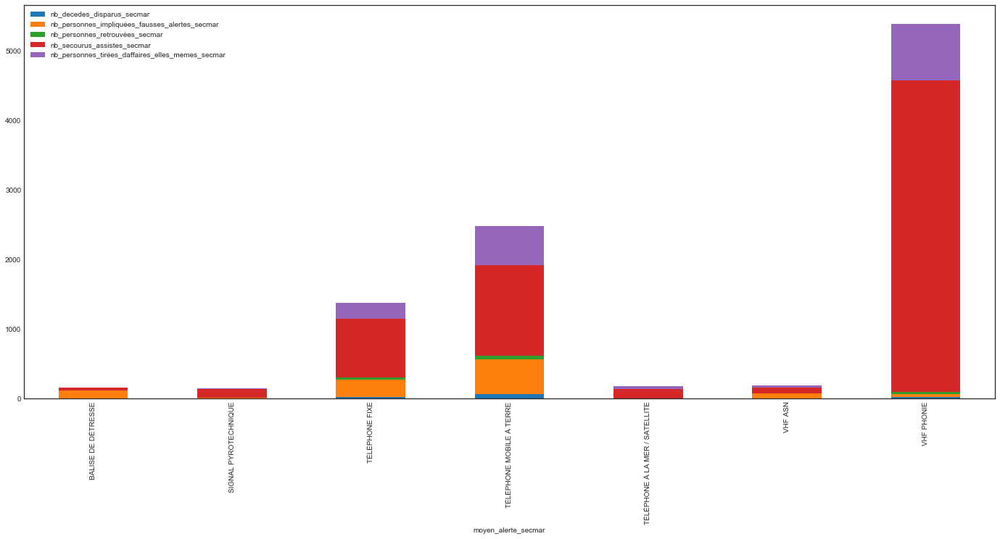

In [401]:
# histogramme en fonction des moyens d'alerte
import seaborn as sns
import matplotlib as plt
from matplotlib import rc
%matplotlib inline


sns.set_style("white")
sns.set_context({"figure.figsize": (24, 10)})


#sns.barplot(x =bilan_alerte.index.values, y = bilan_alerte.nb_total_impliqués, color = "red")
#decedes_plot = sns.barplot(x = bilan_alerte.index.values, y = bilan_alerte.nb_decedes_disparus_secmar, color = "#9b59b6")
#decedes_plot = sns.barplot(x = bilan_alerte.index.values, y = bilan_alerte.nb_personnes_impliquées_fausses_alertes_secmar, color = "#3498db")
#decedes_plot = sns.barplot(x = bilan_alerte.index.values, y = bilan_alerte.nb_personnes_retrouvées_secmar, color = "#95a5a6")
#decedes_plot = sns.barplot(x = bilan_alerte.index.values, y = bilan_alerte.nb_secourus_assistes_secmar, color = "#e74c3c")
#decedes_plot = sns.barplot(x = bilan_alerte.index.values, y = bilan_alerte.nb_personnes_tirées_daffaires_elles_memes_secmar, color = "#34495e")

bilan_alerte.drop(['cross_sitrep_secmar', 'nb_total_impliqués'], axis=1).plot.bar(stacked=True)



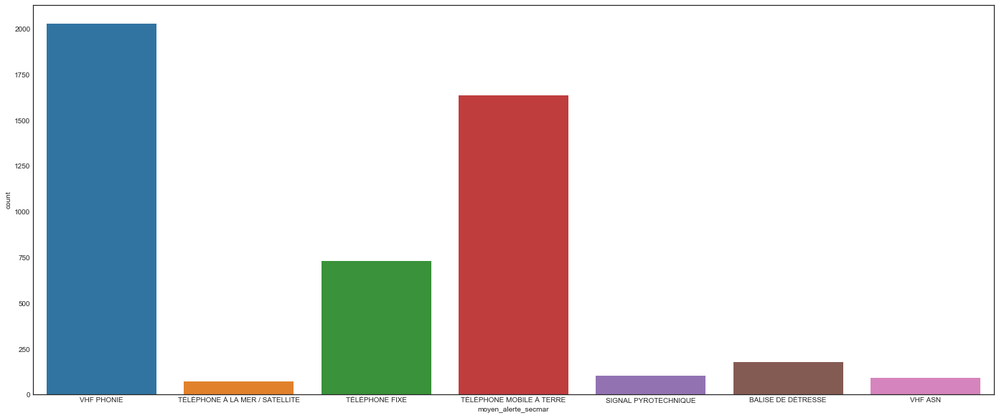

In [400]:
import seaborn as sns
import matplotlib as plt
from matplotlib import rc
%matplotlib inline


sns.set_style("white")
sns.set_context({"figure.figsize": (24, 10)})

sns.countplot(x="moyen_alerte_secmar", data=moyen)

In [224]:
#Difference de classification sur les moyens 
Checker numero de sitrep 
sauvamer_secmar.groupby('type_embarcation_sauvamer')[['flotteur_commerce_secmar', 'flotteur_peche_secmar', 'flotteur_plaisance_secmar', 'flotteur_loisir_nautique_secmar', 'flotteur_autre_secmar']].sum()

,flotteur_commerce_secmar,flotteur_peche_secmar,flotteur_plaisance_secmar,flotteur_loisir_nautique_secmar,flotteur_autre_secmar
type_embarcation_sauvamer,,,,,
AÉRONEF,NaN,NaN,NaN,NaN,NaN
ENGIN DE PLAGE,0.0,0.0,23.0,79.0,7.0
KITESURF,0.0,0.0,1.0,75.0,0.0
NAVIRE ADMINISTRATION/ARMÉE,1.0,0.0,2.0,0.0,3.0
NAVIRE DE COMMERCE,18.0,1.0,2.0,1.0,1.0
NAVIRE DE PÊCHE,1.0,186.0,7.0,0.0,8.0
NAVIRE FLUVIAL,0.0,0.0,8.0,0.0,0.0
PLAISANCE PROFESSIONNELLE,7.0,1.0,9.0,0.0,1.0
PLAISANCE À MOTEUR,3.0,3.0,1120.0,5.0,9.0


In [402]:
sauvamer_secmar_plaisance.groupby(['evenement_secmar'])[['nb_decedes_disparus_secmar',
                                                               'nb_personnes_impliquées_fausses_alertes_secmar',
                                                              'nb_personnes_retrouvées_secmar',
                                                              'nb_personnes_secourues_secmar',
                                                              'nb_personnes_tirées_daffaires_elles_memes_secmar', 
                                                             'nb_personnes_asssistées_secmar']].sum()

,nb_decedes_disparus_secmar,nb_personnes_impliquées_fausses_alertes_secmar,nb_personnes_retrouvées_secmar,nb_personnes_secourues_secmar,nb_personnes_tirées_daffaires_elles_memes_secmar,nb_personnes_asssistées_secmar
evenement_secmar,,,,,,
ABORDAGE,1.0,0.0,0.0,38.0,45.0,21.0
AUTRE ACCIDENT,1.0,0.0,0.0,5.0,28.0,6.0
AUTRE ÉVÉNEMENT,8.0,9.0,10.0,131.0,126.0,238.0
AVARIE DE L'APPAREIL À GOUVERNER,0.0,0.0,0.0,44.0,130.0,411.0
AVARIE DES SYSTÈMES DE COMMUNICATION,0.0,0.0,0.0,2.0,0.0,0.0
AVARIE DU SYSTÈME DE PROPULSION,6.0,1.0,32.0,287.0,768.0,5829.0
AVARIE ÉLECTRIQUE,0.0,0.0,3.0,28.0,90.0,673.0
BAIGNADE,15.0,0.0,1.0,30.0,13.0,12.0
BLESSÉ AVEC DÉROUTEMENT,0.0,2.0,0.0,70.0,9.0,18.0


In [191]:
# Nombre d'opération par département pour faire la carto page 1
sauvamer_secmar_plaisance.departement_secmar.value_counts(dropna=False)

VAR                                 727
NaN                                 563
FINISTÈRE                           483
MORBIHAN                            469
BOUCHES-DU-RHÔNE                    383
ALPES-MARITIMES                     355
CÔTES-D'ARMOR                       337
CORSE-DU-SUD                        297
HÉRAULT                             278
CHARENTE-MARITIME                   273
GIRONDE                             263
MANCHE                              257
MARTINIQUE                          223
VENDÉE                              214
LOIRE-ATLANTIQUE                    188
GUADELOUPE                          180
ILLE-ET-VILAINE                     156
NOUVELLE-CALÉDONIE                  153
HAUTE-CORSE                         153
CALVADOS                            148
POLYNÉSIE                           132
MAYOTTE                             128
PYRÉNÉES-ORIENTALES                 124
SEINE-MARITIME                       96
AUDE                                 95


7140